# General MCMC algorithms Running Diagnostics

In [1]:
import numpy as np
import torch
from numpy import random
import matplotlib.pyplot as plt
from scipy.stats import multivariate_normal

import sys
sys.path.insert(0, 'packages/')

from distribution import distribution
import utils
from mcmc import mcmc_algos
from plots import plots
from layers_pt import Net

#import utils
#from importlib import reload
#reload(utils)

In [2]:
device = 'cuda:0' if torch.cuda.is_available() else 'cpu' # switch to gpu if you want, but beware of the codelines in every step
device = "cpu"
device

'cpu'

## Initialising Types of Algorithms and Target Distributions

In [3]:
title_moon = 'Moon'
title_moon2 = 'Moon2'
title_gmm = 'GMM'

algo_rwm = 'RWM'
algo_mala = 'MALA'
algo_hmc = 'HMC'

## Initialising the Values

In [4]:
# For GMM model
x0 = torch.tensor([-10.,8.,-8.,10.,0.,-5.,5.,0.,0.,-5.,5.,-5.,5.])
y0 = torch.tensor([10.,8.,-8.,-10.,0.,0.,0.,-5.,5.,5.,-5.,-5.,5.])
colors = np.array(['red','blue','green','orange','purple','cyan','magenta','yellow','brown','navy','pink','maroon','gray'])

In [5]:
# For Moon model
#x0 = torch.tensor([-0.2763, -0.5227, 0.2667, 1.1608, -0.0107, -0.5375, -0.1518, -0.4553, -0.2056, 2.0992])
#y0 = torch.tensor([0.9025, -0.8384, -0.4792, -0.3755, -0.5761, 1.2326, 1.1072, 1.2231, 0.4552, 0.6527])
#colors = np.array(['red','blue','green','orange','purple','yellow','brown','navy','pink','gray'])

In [6]:
# Randomised values
def initial_value(n_sample,dim):
    return torch.randn(n_sample, dim)

In [7]:
chainlen = 10000 # iterations
x_dim = 2 # number of dimensions

n_sample = len(colors) # number of chains
Z0 = torch.tensor(np.array([x0,y0])).T
num_bin = int(np.sqrt(chainlen)) # for kl-div later

In [8]:
# Color definition for plots
c_l2hmc, c_hmc1, c_hmc2, c_hmc3 = 'blue', 'orange', 'green', 'red'
c_true, c_contour = 'purple', '0.75'
x_lims = [-12,12]
y_lims = [-12,12]

In [9]:
def plot_gaussian_contours(mus, covs, colors=['blue', 'red'], spacing=5,
        x_lims=[-4,4], y_lims=[-3,3], res=100):

    X = np.linspace(x_lims[0], x_lims[1], res)
    Y = np.linspace(y_lims[0], y_lims[1], res)
    X, Y = np.meshgrid(X, Y)
    pos = np.empty(X.shape + (2,))
    pos[:, :, 0] = X
    pos[:, :, 1] = Y

    for i in range(len(mus)):
        mu = mus[i]
        cov = covs[i]
        F = multivariate_normal(mu, cov)
        Z = F.pdf(pos)
        plt.contour(X, Y, Z, spacing, colors=colors[0])

    return plt


def contour_compare(name, sample, c1, mus, covs):
    for i in range(len(c1)):
        plot_gaussian_contours(mus, covs, colors=[c_contour, c_contour], x_lims=[-12,12], y_lims=[-12,12], res=200)
        plt.plot(sample[i][:,:,0].flatten(), sample[i][:,:,1].flatten(), marker='o', alpha=0.6)
        plt.title('{} Distribution with parameter : {:.3f}'.format(name, c1[i]))
        plt.tight_layout()
        
        plt.show()

### This chunk is to initial mus, covs and pis of GMM

In [10]:
# This chunk is to initial mus, covs and pis of GMM
mu_1 = torch.tensor([-5., 5.])
mu_2 = torch.tensor([5., -5.])
mu_3 = torch.tensor([5.,5.])
mu_4 = torch.tensor([-5.,-5.])
mus = torch.tensor(np.array([mu_1,mu_2,mu_3,mu_4]), dtype=torch.float32, device=device)

cov_1 = 0.9 * torch.eye(2)
cov_2 = 1.2 * torch.eye(2)
cov_3 = 0.04 * torch.tensor([[5,-4],[-4,5]])
cov_4 = 0.08* torch.tensor([[5,4],[4,5]])
covs = torch.tensor(np.array([cov_1, cov_2, cov_3, cov_4]),dtype=torch.float32, device=device)

pis = torch.tensor(np.array([0.25, 0.25, 0.25, 0.25]), dtype=torch.float32, device=device)

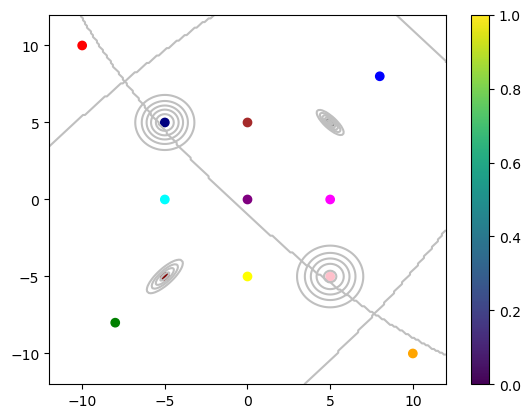

In [11]:
plot_gaussian_contours(mus, covs, colors=[c_contour, c_contour], x_lims=[-12,12], y_lims=[-12,12], res=200)
plt.scatter(x0,y0,c=colors)
plt.colorbar();
plt.show()

## Theoretical Distributions

In [22]:
#dist = distribution(title_moon, device)
#dist1 = distribution(title_moon2, device)
dist2 = distribution(title_gmm, device, mus, covs, pis)

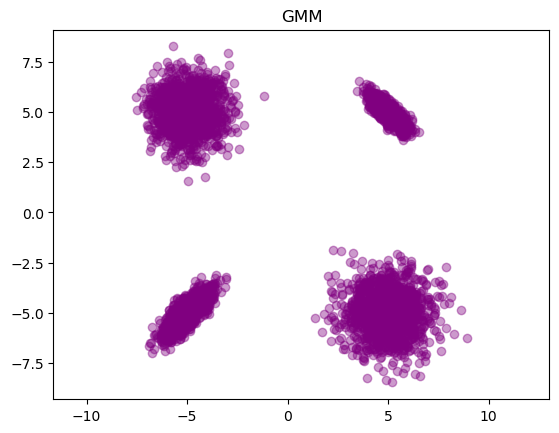

In [13]:
#S, hist_0 = plots('theory', dist, num_bin, colors=c_true).theory(title_moon,chainlen)
S0, hist_1 = plots('theory', dist2, num_bin, colors=c_true).theory(title_gmm,int(chainlen/2))

In [14]:
# def npdensity(z):
#     z = np.reshape(z, [z.shape[0], 2])
#     z1, z2 = z[:, 0], z[:, 1]
#     E_y = z1**2/2
#     E_x = (z2 - z1**2 + 4)**2/2
#     return np.exp(-(E_y+E_x))

# r = np.linspace(-7.5, 7.5, 1000)
# x, y = np.meshgrid(r, r)
# z = np.vstack([x.flatten(), y.flatten()]).T

# q0 = npdensity(z)
# plt.pcolormesh(x, y, q0.reshape(x.shape),
#                            cmap=plt.cm.Reds_r)
# plt.gca().set_aspect('equal', adjustable='box')
# plt.title('Moon Distribution')
# plt.show()

In [15]:
# # For moon contour plot later on
# x_edges = np.linspace(-4,4,int(np.sqrt(10000)))
# y_edges = np.linspace(-7,5,int(np.sqrt(10000)))
# X, Y = np.meshgrid(x_edges, y_edges)

# grid_points = np.vstack([X.ravel(), Y.ravel()]).T
# grid_tensor = torch.from_numpy(grid_points.astype(np.float32))
# with torch.no_grad():
#     Z = npdensity(grid_tensor).numpy().reshape(X.shape)

# Random Walk Metropolis Algorithm (RWM)

In [23]:
c = [0.01, 1., 2., 3., 4., 5., 20., 50., 100.]

timetaken = []
count = []
rwm = []
kl_divergence = []
ess = []

for i in range(len(c)):
    #t1, x, y, z, e = mcmc_algos(algo_rwm, hist_0, num_bin, chainlen, Z0, c[i]).result(dist)
    t1, x, y, z, e = mcmc_algos(algo_rwm, hist_1, num_bin, chainlen, Z0, c[i]).result(dist2)
    timetaken.append(t1)
    count.append(x)
    rwm.append(y)
    kl_divergence.append(z)
    ess.append(e)

100%|███████████████████████████████████████████████████████████████████████████| 10000/10000 [00:39<00:00, 252.11it/s]


# Metropolis-Adjusted Langevin Algorithm (MALA)

In [16]:
step = [0.01, 0.1, 0.2, 0.3, 0.4, 0.5, 1, 10]

timetaken2 = []
count2 = []
mala = []
kl_divergence2 = []
ess2 = []

for i in range(len(step)):
    #t, x, y, z, e = mcmc_algos(algo_mala, hist_0, num_bin, chainlen, Z0, step[i]).result(dist1)
    t, x, y, z, e = mcmc_algos(algo_mala, hist_1, num_bin, chainlen, Z0, step[i]).result(dist2)
    timetaken2.append(t)
    count2.append(x)
    mala.append(y)
    kl_divergence2.append(z)
    ess2.append(e)    

100%|████████████████████████████████████████████████████████████████████████████| 10000/10000 [01:47<00:00, 92.85it/s]
C:\Users\justi\anaconda3\Lib\site-packages\numpy\lib\histograms.py:1067: RuntimeWarning: invalid value encountered in divide
  hist /= s
100%|████████████████████████████████████████████████████████████████████████████| 10000/10000 [01:57<00:00, 84.75it/s]
C:\Users\justi\anaconda3\Lib\site-packages\statsmodels\tsa\stattools.py:691: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
100%|███████████████████████████████████████████████████████████████████████████| 10000/10000 [01:27<00:00, 114.26it/s]


Caution: This code is only usable to HMC and L2HMC when we want to compute GMM as target distribution

In [17]:
# Use with caution
from distribution import Moon, four_GMM
#dist = Moon(device=device)
dist2 = four_GMM(mus, covs, pis, device=device) 


C:\Users\justi\Thesis\packages\distribution.py:90: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.log_pis = [torch.tensor(np.log(self.p1), dtype=torch.float32, device=device),
C:\Users\justi\Thesis\packages\distribution.py:91: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  torch.tensor(np.log(self.p2), dtype=torch.float32, device=device),
C:\Users\justi\Thesis\packages\distribution.py:92: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  torch.tensor(np.log(self.p3), dtype=torch.float32, device=device),
C:\Users\justi\Thesis\packages\distr

# Hamiltonian Monte Carlo (HMC)

In [18]:
T = [10,5,2,1]
eps = [0.6,0.5,0.2,0.1,0.05,0.02,0.01]
#T = torch.tensor([2])
#eps = torch.tensor([0.2,0.1])

timetaken3 = []
accept3 = []
hmc = []
kl_divergence3 = []
ess3 = []

for i in range(len(T)):
    for j in range(len(eps)):
        if T[i] < 5 or ((T[i] == 5 and eps[j] < 0.5) or (T[i] == 10 and eps[j] == 0.1)):
            #tt, x, y, z, e = mcmc_algos(algo_hmc, hist_0, num_bin, chainlen, Z0, T[i], eps[j], n_sample, x_dim, 0, device, True).result(dist)
            tt, x, y, z, e = mcmc_algos(algo_hmc, hist_1, num_bin, chainlen, Z0, T[i], eps[j], n_sample, x_dim, 0, device, True).result(dist2)
            timetaken3.append(tt)
            accept3.append(x)
            hmc.append(y)
            kl_divergence3.append(z)
            ess3.append(e)

100%|███████████████████████████████████████████████████████████████████████████| 10000/10000 [00:52<00:00, 188.71it/s]


# Learning To Hamiltonian Monte Carlo (L2HMC)

In [19]:
network = Net
T = [10,5,2,1]
eps = [0.6,0.5,0.2,0.1,0.05,0.02,0.01]
#T = torch.tensor([2])
#eps = torch.tensor([0.5,0.2])

timetaken4 = []
accept4 = []
l2hmc = []
kl_divergence4 = []
ess4 = []

for i in range(len(T)):
    for j in range(len(eps)):
        if T[i] < 5 or ((T[i] == 5 and eps[j] < 0.5) or (T[i] == 10 and eps[j] == 0.1)):
            #t, x, y, z, e = mcmc_algos(algo_hmc, hist_0, num_bin, chainlen, Z0, T[i], eps[j], n_sample, x_dim, network, device, False).result(dist)
            t, x, y, z, e = mcmc_algos(algo_hmc, hist_1, num_bin, chainlen, Z0, T[i], eps[j], n_sample, x_dim, network, device, False).result(dist2)
            timetaken4.append(t)
            accept4.append(x)
            l2hmc.append(y)
            kl_divergence4.append(z)
            ess4.append(e)

  0%|                                                                                 | 1/2500 [00:00<19:22,  2.15it/s]

Step: 0 / 2500, Loss: 6.06e+02, Acceptance sample: 0.37, LR: 0.00100


 40%|███████████████████████████████▏                                              | 1001/2500 [09:16<12:08,  2.06it/s]

Step: 1000 / 2500, Loss: -8.07e+02, Acceptance sample: 0.05, LR: 0.00096


 80%|██████████████████████████████████████████████████████████████▍               | 2001/2500 [20:00<06:20,  1.31it/s]

Step: 2000 / 2500, Loss: -1.64e+03, Acceptance sample: 0.22, LR: 0.00092


100%|██████████████████████████████████████████████████████████████████████████████| 2500/2500 [24:58<00:00,  1.67it/s]


Step: 2499 / 2500, Loss: -4.69e+02, Acceptance sample: 0.03, LR: 0.00092


  0%|                                                                                 | 1/2500 [00:00<09:40,  4.30it/s]

Step: 0 / 2500, Loss: 6.61e+02, Acceptance sample: 0.30, LR: 0.00100


 40%|███████████████████████████████▏                                              | 1001/2500 [04:42<07:52,  3.17it/s]

Step: 1000 / 2500, Loss: -9.72e+02, Acceptance sample: 0.07, LR: 0.00096


 80%|██████████████████████████████████████████████████████████████▍               | 2001/2500 [10:00<02:33,  3.25it/s]

Step: 2000 / 2500, Loss: -1.84e+03, Acceptance sample: 0.33, LR: 0.00092


100%|██████████████████████████████████████████████████████████████████████████████| 2500/2500 [12:38<00:00,  3.29it/s]


Step: 2499 / 2500, Loss: -1.81e+03, Acceptance sample: 0.29, LR: 0.00092


  0%|                                                                                 | 1/2500 [00:00<13:21,  3.12it/s]

Step: 0 / 2500, Loss: 1.21e+02, Acceptance sample: 0.52, LR: 0.00100


 40%|███████████████████████████████▏                                              | 1001/2500 [05:22<08:00,  3.12it/s]

Step: 1000 / 2500, Loss: -1.35e+03, Acceptance sample: 0.45, LR: 0.00096


 80%|██████████████████████████████████████████████████████████████▍               | 2001/2500 [10:42<02:40,  3.10it/s]

Step: 2000 / 2500, Loss: -1.35e+03, Acceptance sample: 0.35, LR: 0.00092


100%|██████████████████████████████████████████████████████████████████████████████| 2500/2500 [13:20<00:00,  3.12it/s]


Step: 2499 / 2500, Loss: -1.30e+03, Acceptance sample: 0.33, LR: 0.00092


  0%|                                                                                 | 1/2500 [00:00<13:09,  3.16it/s]

Step: 0 / 2500, Loss: 3.51e+01, Acceptance sample: 0.69, LR: 0.00100


 40%|███████████████████████████████▏                                              | 1001/2500 [05:20<08:19,  3.00it/s]

Step: 1000 / 2500, Loss: -1.49e+03, Acceptance sample: 0.65, LR: 0.00096


 80%|██████████████████████████████████████████████████████████████▍               | 2001/2500 [10:42<02:38,  3.15it/s]

Step: 2000 / 2500, Loss: -1.17e+03, Acceptance sample: 0.54, LR: 0.00092


100%|██████████████████████████████████████████████████████████████████████████████| 2500/2500 [13:22<00:00,  3.11it/s]


Step: 2499 / 2500, Loss: -1.23e+03, Acceptance sample: 0.50, LR: 0.00092


  0%|                                                                                 | 1/2500 [00:00<11:46,  3.54it/s]

Step: 0 / 2500, Loss: 4.05e+01, Acceptance sample: 0.79, LR: 0.00100


 40%|███████████████████████████████▏                                              | 1001/2500 [05:02<07:31,  3.32it/s]

Step: 1000 / 2500, Loss: -1.27e+03, Acceptance sample: 0.27, LR: 0.00096


 80%|██████████████████████████████████████████████████████████████▍               | 2001/2500 [10:11<02:33,  3.24it/s]

Step: 2000 / 2500, Loss: -1.28e+03, Acceptance sample: 0.45, LR: 0.00092


100%|██████████████████████████████████████████████████████████████████████████████| 2500/2500 [12:45<00:00,  3.27it/s]


Step: 2499 / 2500, Loss: -1.26e+03, Acceptance sample: 0.47, LR: 0.00092


  0%|                                                                                 | 1/2500 [00:00<09:58,  4.17it/s]

Step: 0 / 2500, Loss: 9.47e+01, Acceptance sample: 0.86, LR: 0.00100


 40%|███████████████████████████████▏                                              | 1001/2500 [03:54<05:52,  4.25it/s]

Step: 1000 / 2500, Loss: -1.41e+03, Acceptance sample: 0.34, LR: 0.00096


 80%|██████████████████████████████████████████████████████████████▍               | 2001/2500 [07:49<01:56,  4.28it/s]

Step: 2000 / 2500, Loss: -1.08e+03, Acceptance sample: 0.33, LR: 0.00092


100%|██████████████████████████████████████████████████████████████████████████████| 2500/2500 [09:45<00:00,  4.27it/s]


Step: 2499 / 2500, Loss: -9.61e+02, Acceptance sample: 0.34, LR: 0.00092


  0%|                                                                                 | 3/2500 [00:00<04:20,  9.59it/s]

Step: 0 / 2500, Loss: 6.48e+02, Acceptance sample: 0.35, LR: 0.00100


 40%|███████████████████████████████▎                                              | 1002/2500 [01:46<02:36,  9.55it/s]

Step: 1000 / 2500, Loss: -1.20e+03, Acceptance sample: 0.49, LR: 0.00096


 80%|██████████████████████████████████████████████████████████████▍               | 2002/2500 [03:32<00:52,  9.53it/s]

Step: 2000 / 2500, Loss: -1.19e+03, Acceptance sample: 0.35, LR: 0.00092


100%|██████████████████████████████████████████████████████████████████████████████| 2500/2500 [04:25<00:00,  9.40it/s]


Step: 2499 / 2500, Loss: -1.14e+03, Acceptance sample: 0.32, LR: 0.00092


  0%|                                                                                 | 3/2500 [00:00<04:21,  9.53it/s]

Step: 0 / 2500, Loss: 9.69e+02, Acceptance sample: 0.18, LR: 0.00100


 40%|███████████████████████████████▎                                              | 1002/2500 [01:47<02:39,  9.39it/s]

Step: 1000 / 2500, Loss: -1.12e+03, Acceptance sample: 0.32, LR: 0.00096


 80%|██████████████████████████████████████████████████████████████▍               | 2003/2500 [03:33<00:53,  9.38it/s]

Step: 2000 / 2500, Loss: -1.16e+03, Acceptance sample: 0.40, LR: 0.00092


100%|██████████████████████████████████████████████████████████████████████████████| 2500/2500 [04:26<00:00,  9.40it/s]


Step: 2499 / 2500, Loss: -1.18e+03, Acceptance sample: 0.33, LR: 0.00092


  0%|                                                                                 | 2/2500 [00:00<05:53,  7.07it/s]

Step: 0 / 2500, Loss: 1.18e+02, Acceptance sample: 0.57, LR: 0.00100


 40%|███████████████████████████████▎                                              | 1003/2500 [01:46<02:36,  9.56it/s]

Step: 1000 / 2500, Loss: -1.16e+03, Acceptance sample: 0.31, LR: 0.00096


 80%|██████████████████████████████████████████████████████████████▍               | 2002/2500 [03:32<00:51,  9.68it/s]

Step: 2000 / 2500, Loss: -9.91e+02, Acceptance sample: 0.28, LR: 0.00092


100%|██████████████████████████████████████████████████████████████████████████████| 2500/2500 [04:25<00:00,  9.42it/s]


Step: 2499 / 2500, Loss: -9.85e+02, Acceptance sample: 0.19, LR: 0.00092


  0%|                                                                                 | 2/2500 [00:00<04:25,  9.42it/s]

Step: 0 / 2500, Loss: 1.58e+01, Acceptance sample: 0.68, LR: 0.00100


 40%|███████████████████████████████▎                                              | 1002/2500 [01:46<02:37,  9.53it/s]

Step: 1000 / 2500, Loss: -8.80e+02, Acceptance sample: 0.32, LR: 0.00096


 80%|██████████████████████████████████████████████████████████████▍               | 2003/2500 [03:32<00:52,  9.39it/s]

Step: 2000 / 2500, Loss: -1.22e+03, Acceptance sample: 0.26, LR: 0.00092


100%|██████████████████████████████████████████████████████████████████████████████| 2500/2500 [04:25<00:00,  9.41it/s]


Step: 2499 / 2500, Loss: -1.22e+03, Acceptance sample: 0.28, LR: 0.00092


  0%|                                                                                 | 2/2500 [00:00<04:48,  8.66it/s]

Step: 0 / 2500, Loss: 8.19e+01, Acceptance sample: 0.63, LR: 0.00100


 40%|███████████████████████████████▎                                              | 1002/2500 [01:46<02:38,  9.43it/s]

Step: 1000 / 2500, Loss: -1.21e+03, Acceptance sample: 0.42, LR: 0.00096


 80%|██████████████████████████████████████████████████████████████▍               | 2002/2500 [03:32<00:52,  9.54it/s]

Step: 2000 / 2500, Loss: -1.04e+03, Acceptance sample: 0.26, LR: 0.00092


100%|██████████████████████████████████████████████████████████████████████████████| 2500/2500 [04:25<00:00,  9.41it/s]


Step: 2499 / 2500, Loss: -1.01e+03, Acceptance sample: 0.29, LR: 0.00092


  0%|                                                                                 | 2/2500 [00:00<04:23,  9.48it/s]

Step: 0 / 2500, Loss: 1.98e+02, Acceptance sample: 0.93, LR: 0.00100


 40%|███████████████████████████████▎                                              | 1003/2500 [01:45<02:34,  9.66it/s]

Step: 1000 / 2500, Loss: -1.29e+03, Acceptance sample: 0.36, LR: 0.00096


 80%|██████████████████████████████████████████████████████████████▍               | 2002/2500 [03:32<00:53,  9.29it/s]

Step: 2000 / 2500, Loss: -1.13e+03, Acceptance sample: 0.44, LR: 0.00092


100%|██████████████████████████████████████████████████████████████████████████████| 2500/2500 [04:25<00:00,  9.42it/s]


Step: 2499 / 2500, Loss: -1.03e+03, Acceptance sample: 0.37, LR: 0.00092


  0%|                                                                                 | 3/2500 [00:00<04:18,  9.67it/s]

Step: 0 / 2500, Loss: 3.38e+02, Acceptance sample: 0.96, LR: 0.00100


 40%|███████████████████████████████▎                                              | 1003/2500 [01:46<02:36,  9.54it/s]

Step: 1000 / 2500, Loss: -1.05e+03, Acceptance sample: 0.23, LR: 0.00096


 80%|██████████████████████████████████████████████████████████████▍               | 2002/2500 [03:32<00:52,  9.43it/s]

Step: 2000 / 2500, Loss: -1.19e+03, Acceptance sample: 0.24, LR: 0.00092


100%|██████████████████████████████████████████████████████████████████████████████| 2500/2500 [04:25<00:00,  9.41it/s]


Step: 2499 / 2500, Loss: -9.84e+02, Acceptance sample: 0.21, LR: 0.00092


  0%|▏                                                                                | 4/2500 [00:00<02:38, 15.79it/s]

Step: 0 / 2500, Loss: 9.59e+02, Acceptance sample: 0.10, LR: 0.00100


 40%|███████████████████████████████▎                                              | 1004/2500 [01:03<01:32, 16.17it/s]

Step: 1000 / 2500, Loss: -1.31e+03, Acceptance sample: 0.48, LR: 0.00096


 80%|██████████████████████████████████████████████████████████████▌               | 2004/2500 [02:06<00:30, 16.18it/s]

Step: 2000 / 2500, Loss: -1.46e+03, Acceptance sample: 0.48, LR: 0.00092


100%|██████████████████████████████████████████████████████████████████████████████| 2500/2500 [02:37<00:00, 15.89it/s]


Step: 2499 / 2500, Loss: -1.47e+03, Acceptance sample: 0.45, LR: 0.00092


  0%|▏                                                                                | 4/2500 [00:00<02:28, 16.84it/s]

Step: 0 / 2500, Loss: 1.71e+02, Acceptance sample: 0.51, LR: 0.00100


 40%|███████████████████████████████▎                                              | 1004/2500 [01:02<01:33, 16.05it/s]

Step: 1000 / 2500, Loss: -1.03e+03, Acceptance sample: 0.41, LR: 0.00096


 80%|██████████████████████████████████████████████████████████████▌               | 2004/2500 [02:06<00:31, 15.96it/s]

Step: 2000 / 2500, Loss: -9.80e+02, Acceptance sample: 0.33, LR: 0.00092


100%|██████████████████████████████████████████████████████████████████████████████| 2500/2500 [02:37<00:00, 15.89it/s]


Step: 2499 / 2500, Loss: -1.16e+03, Acceptance sample: 0.32, LR: 0.00092


  0%|▏                                                                                | 4/2500 [00:00<02:31, 16.45it/s]

Step: 0 / 2500, Loss: 6.46e+01, Acceptance sample: 0.47, LR: 0.00100


 40%|███████████████████████████████▎                                              | 1004/2500 [01:03<01:33, 16.05it/s]

Step: 1000 / 2500, Loss: -1.04e+03, Acceptance sample: 0.46, LR: 0.00096


 80%|██████████████████████████████████████████████████████████████▌               | 2004/2500 [02:06<00:30, 16.07it/s]

Step: 2000 / 2500, Loss: -9.42e+02, Acceptance sample: 0.38, LR: 0.00092


100%|██████████████████████████████████████████████████████████████████████████████| 2500/2500 [02:37<00:00, 15.86it/s]


Step: 2499 / 2500, Loss: -1.17e+03, Acceptance sample: 0.42, LR: 0.00092


  0%|▏                                                                                | 4/2500 [00:00<02:36, 15.94it/s]

Step: 0 / 2500, Loss: 3.43e+01, Acceptance sample: 0.86, LR: 0.00100


 40%|███████████████████████████████▎                                              | 1004/2500 [01:03<01:34, 15.90it/s]

Step: 1000 / 2500, Loss: -1.06e+03, Acceptance sample: 0.45, LR: 0.00096


 80%|██████████████████████████████████████████████████████████████▌               | 2004/2500 [02:06<00:31, 15.93it/s]

Step: 2000 / 2500, Loss: -9.82e+02, Acceptance sample: 0.18, LR: 0.00092


100%|██████████████████████████████████████████████████████████████████████████████| 2500/2500 [02:37<00:00, 15.84it/s]


Step: 2499 / 2500, Loss: -1.17e+03, Acceptance sample: 0.38, LR: 0.00092


  0%|▏                                                                                | 4/2500 [00:00<02:36, 15.92it/s]

Step: 0 / 2500, Loss: 7.98e+01, Acceptance sample: 0.88, LR: 0.00100


 40%|███████████████████████████████▎                                              | 1004/2500 [01:03<01:35, 15.61it/s]

Step: 1000 / 2500, Loss: -1.09e+03, Acceptance sample: 0.33, LR: 0.00096


 80%|██████████████████████████████████████████████████████████████▌               | 2004/2500 [02:06<00:31, 15.74it/s]

Step: 2000 / 2500, Loss: -1.22e+03, Acceptance sample: 0.40, LR: 0.00092


100%|██████████████████████████████████████████████████████████████████████████████| 2500/2500 [02:37<00:00, 15.87it/s]


Step: 2499 / 2500, Loss: -1.22e+03, Acceptance sample: 0.42, LR: 0.00092


  0%|▏                                                                                | 4/2500 [00:00<02:35, 16.09it/s]

Step: 0 / 2500, Loss: 5.66e+02, Acceptance sample: 0.95, LR: 0.00100


 40%|███████████████████████████████▎                                              | 1004/2500 [01:03<01:35, 15.68it/s]

Step: 1000 / 2500, Loss: -8.45e+02, Acceptance sample: 0.42, LR: 0.00096


 80%|██████████████████████████████████████████████████████████████▌               | 2004/2500 [02:06<00:31, 15.94it/s]

Step: 2000 / 2500, Loss: -1.07e+03, Acceptance sample: 0.35, LR: 0.00092


100%|██████████████████████████████████████████████████████████████████████████████| 2500/2500 [02:37<00:00, 15.85it/s]


Step: 2499 / 2500, Loss: -1.17e+03, Acceptance sample: 0.40, LR: 0.00092


  0%|▏                                                                                | 4/2500 [00:00<02:35, 16.09it/s]

Step: 0 / 2500, Loss: 7.22e+02, Acceptance sample: 0.98, LR: 0.00100


 40%|███████████████████████████████▎                                              | 1004/2500 [01:03<01:32, 16.19it/s]

Step: 1000 / 2500, Loss: -3.72e+02, Acceptance sample: 0.32, LR: 0.00096


 80%|██████████████████████████████████████████████████████████████▌               | 2004/2500 [02:06<00:30, 16.21it/s]

Step: 2000 / 2500, Loss: -1.36e+03, Acceptance sample: 0.30, LR: 0.00092


100%|██████████████████████████████████████████████████████████████████████████████| 2500/2500 [02:37<00:00, 15.88it/s]


Step: 2499 / 2500, Loss: -1.51e+03, Acceptance sample: 0.26, LR: 0.00092


100%|████████████████████████████████████████████████████████████████████████████| 10000/10000 [02:09<00:00, 77.25it/s]


# Evaluation Metrics and Plots

In [24]:
# RWM
print('RWM')
utils.evaluate(timetaken, count, rwm, kl_divergence, ess, c, n_sample, 'c')
print('\nMALA')
# MALA
utils.evaluate(timetaken2, count2, mala, kl_divergence2, ess2, step, n_sample, 'step')
print('\nHMC')
# HMC
utils.evaluate2(timetaken3, accept3, hmc, kl_divergence3, ess3, T, eps, n_sample)
print('\nL2HMC')
# L2HMC
utils.evaluate2(timetaken4, accept4, l2hmc, kl_divergence4, ess4, T, eps, n_sample)

RWM
Given parameter c = 0.01, 47.75 % accepted overall, Time taken: 23.870s, 
KL Divergence: 12.8014 and ESS for x0: 108.273, x1: 136.667
Given parameter c = 0.01, 41.24 % accepted overall, Time taken: 23.582s, 
KL Divergence: 11.8286 and ESS for x0: 237.834, x1: 320.307
Given parameter c = 0.01, 43.78 % accepted overall, Time taken: 23.869s, 
KL Divergence: 12.0922 and ESS for x0: 97.965, x1: 117.148
Given parameter c = 0.01, 48.00 % accepted overall, Time taken: 24.823s, 
KL Divergence: 13.0728 and ESS for x0: 24.509, x1: 46.338
Given parameter c = 0.01, 47.75 % accepted overall, Time taken: 24.440s, 
KL Divergence: 12.9799 and ESS for x0: 17.195, x1: 88.587
Given parameter c = 0.01, 47.54 % accepted overall, Time taken: 23.784s, 
KL Divergence: 12.7504 and ESS for x0: 41.586, x1: 138.494
Given parameter c = 0.01, 47.84 % accepted overall, Time taken: 24.274s, 
KL Divergence: 12.7730 and ESS for x0: 15.807, x1: 107.097
Given parameter c = 0.01, 47.95 % accepted overall, Time taken: 2

## Summarising the metrics

In [25]:
print('RWM')
for i in range(len(c)):
    print('Parameter: {}'.format(c[i]))
    print('Acceptance Probability: {:.2f}%, Total time: {:.2f}, KL-div: {:.4f}, ESS: {}'.format(round(np.nanmean(np.array(count)[i]/100),2), np.sum(np.array(timetaken)[i]), np.nanmean(np.array(kl_divergence)[i]), np.nanmean(np.array(ess)[i],axis=0)))
print('\nMALA')
for i in range(len(step)):
    print('Parameter: {}'.format(step[i]))
    print('Acceptance Probability: {:.2f}%, Total time: {:.2f}, KL-div: {:.4f}, ESS: {}'.format(round(np.nanmean(np.array(count2)[i]/100),2), np.sum(np.array(timetaken2)[i]), np.nanmean(np.array(kl_divergence2)[i]), np.nanmean(np.array(ess2)[i],axis=0)))
print('\nHMC')
counts = 0
for i in range(len(T)):
    for j in range(len(eps)):
        if T[i] < 5 or ((T[i] == 5 and eps[j] < 0.5) or (T[i] == 10 and eps[j] == 0.1)):
            counts += 1
            print('Parameter path length: {} and step size: {}'.format(T[i],eps[j]))
            print('Acceptance Probability: {:.2f}%, Total time: {:.2f}, KL-div: {:.4f}, ESS: {}'.format(np.array(accept3)[counts-1]*100, np.array(timetaken3)[counts-1], np.nanmean(kl_divergence3[counts-1]), np.nanmean(ess3[counts-1],axis=1)))
print('\nL2HMC')
counts = 0
for i in range(len(T)):
    for j in range(len(eps)):
        if T[i] < 5 or ((T[i] == 5 and eps[j] < 0.5) or (T[i] == 10 and eps[j] == 0.1)):
            counts += 1
            print('Parameter path length: {} and step size: {}'.format(T[i],eps[j]))
            print('Acceptance Probability: {:.2f}%, Total time: {:.2f}, KL-div: {:.4f}, ESS: {}'.format(np.array(accept4)[counts-1]*100, np.array(timetaken4)[counts-1], np.nanmean(kl_divergence4[counts-1]), np.nanmean(ess4[counts-1],axis=1)))

RWM
Parameter: 0.01
Acceptance Probability: 46.10%, Total time: 314.45, KL-div: 12.6456, ESS: [ 95.27192119 126.90208334]
Parameter: 1.0
Acceptance Probability: 21.34%, Total time: 323.37, KL-div: 12.3245, ESS: [2255.65236704 3228.51654521]
Parameter: 2.0
Acceptance Probability: 16.95%, Total time: 331.25, KL-div: 12.4240, ESS: [2764.11446419 3800.20795752]
Parameter: 3.0
Acceptance Probability: 11.86%, Total time: 334.69, KL-div: 12.3997, ESS: [2675.48631289 2073.85019347]
Parameter: 4.0
Acceptance Probability: 11.56%, Total time: 332.70, KL-div: 11.6354, ESS: [2496.06178556 2304.3795549 ]
Parameter: 5.0
Acceptance Probability: 7.79%, Total time: 442.88, KL-div: 11.5833, ESS: [1466.55265513 1071.96486228]
Parameter: 20.0
Acceptance Probability: 2.94%, Total time: 451.10, KL-div: 12.5220, ESS: [55.86949931 89.1919904 ]
Parameter: 50.0
Acceptance Probability: 1.77%, Total time: 459.18, KL-div: 13.7679, ESS: [182.78217982 213.81170069]
Parameter: 100.0
Acceptance Probability: 1.27%, Tota

# Plot Functions

In [26]:
def plot_density(name, algo, mus, covs, sample, c):
    c_contour = '0.75'
    x_edges = np.linspace(-10,10,int(np.sqrt(10000)))
    y_edges = np.linspace(-8,8,int(np.sqrt(10000)))
    
    for i in range(len(c)):
        x_try = np.array(sample[i])
        plt.figure(figsize=(12, 6))
        plot_gaussian_contours(mus, covs, colors=[c_contour, c_contour], x_lims=[-12,12], y_lims=[-12,12], res=200)
        plt.hist2d(x_try[:,:,0].flatten(), x_try[:,:,1].flatten(), bins=[x_edges, y_edges], cmap=plt.cm.Reds_r)
        plt.colorbar()
        plt.title('2D Histogram of {} Distribution with {} Parameter {:.3f}'.format(name, algo, c[i]))
        plt.show()

def plot_density2(name, algo, mus, covs, sample, para1, para2):
    c_contour = '0.75'
    x_edges = np.linspace(-10,10,int(np.sqrt(10000)))
    y_edges = np.linspace(-8,8,int(np.sqrt(10000)))

    counter = 0
    for i in range(len(para1)):
        for j in range(len(para2)):
            if para1[i] < 5 or ((para1[i] == 5 and para2[j] < 0.5) or (para1[i] == 10 and para2[j] == 0.1)):
                
                counter += 1
                x_try = np.array(sample[counter-1])
                plt.figure(figsize=(12, 6))
                plot_gaussian_contours(mus, covs, colors=[c_contour, c_contour], x_lims=[-12,12], y_lims=[-12,12], res=200)
                plt.hist2d(x_try[:,:,0].flatten(), x_try[:,:,1].flatten(), bins=[x_edges, y_edges], cmap=plt.cm.Reds_r)
                plt.colorbar()
                plt.title('2D Histogram of {} Distribution with {} path length: {:.3f} and step size: {:.3f}'.format(name, algo, para1[i], para2[j]))
                plt.show()

In [27]:
def plot_compare(name, algo, mus, covs, colors, sample, c):
    for i in range(len(c)):
        xp_np = np.array(sample[i])
        plot_gaussian_contours(mus, covs, colors=[c_contour, c_contour], x_lims=[-12,12], y_lims=[-12,12], res=200)
        plt.scatter(x0,y0, color=colors, s=10, marker='o', label='Initial points')
        plt.scatter(xp_np[:,xp_np.shape[1]-1,0],xp_np[:,xp_np.shape[1]-1,1], color=colors, marker='x', label='End points')

        for j in range(xp_np.shape[0]):
            plt.plot(xp_np[j,:,0], xp_np[j,:,1], color=colors[j], alpha=0.3, linewidth=1)
        plt.title('12 Sampler Proposals {} Distribution with {} parameter: {:.3f}'.format(name, algo, c[i]))
        plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.05),
          fancybox=True, shadow=True, ncol=5)
        plt.show()

def plot_compare2(name, algo, mus, covs, colors, sample, para1, para2):
     counter = 0
     for i in range(len(para1)):
         for j in range(len(para2)):
             if para1[i] < 5 or ((para1[i] == 5 and para2[j] < 0.5) or (para1[i] == 10 and para2[j] == 0.1)):
                 
                 counter += 1
                 xp_np = np.array(sample[counter-1])
                 plot_gaussian_contours(mus, covs, colors=[c_contour, c_contour], x_lims=[-12,12], y_lims=[-12,12], res=200)
                 plt.scatter(x0,y0, color=colors, s=10, marker='o', label='Initial points')
                 plt.scatter(xp_np[xp_np.shape[0]-1,:,0],xp_np[xp_np.shape[0]-1,:,1], color=colors, marker='x', label='End points')
        
                 for k in range(xp_np.shape[1]):
                     plt.plot(xp_np[:,k,0], xp_np[:,k,1], color=colors[k], alpha=0.3, linewidth=1)
                 plt.title('12 Sampler Proposals {} Distribution with {} path length: {:.3f} and step size: {:.3f}'.format(name, algo, para1[i], para2[j]))
                 plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.05), fancybox=True, shadow=True, ncol=5)
                 plt.show()

In [28]:
def last_iteration(name, algo, mus, covs, size, sample, c):
    for i in range(len(c)):
        xp_np = np.array(sample[i])
        plot_gaussian_contours(mus, covs, colors=[c_contour, c_contour], x_lims=[-12,12], y_lims=[-12,12], res=200)
        plt.plot(xp_np[:,size,0],xp_np[:,size,1],'.')
        plt.xlabel('Phase')
        plt.ylabel('Frequency')
        plt.title('{} Log-likelihood Contours (Iteration: #10000) with {} Parameter {}'.format(name, algo, c[i]))
        plt.show()

def last_iteration2(name, algo, mus, covs, size, sample, para1, para2):
    counter = 0
    for i in range(len(para1)):
        for j in range(len(para2)):
            if para1[i] < 5 or ((para1[i] == 5 and para2[j] < 0.5) or (para1[i] == 10 and para2[j] == 0.1)):
                counter += 1
                xp_np = np.array(sample[counter-1])
                plot_gaussian_contours(mus, covs, colors=[c_contour, c_contour], x_lims=[-12,12], y_lims=[-12,12], res=200)
                plt.plot(xp_np[size,:,0],xp_np[size,:,1],'.')
                plt.xlabel('Phase')
                plt.ylabel('Frequency')
                plt.title('{} Log-likelihood Contours (Iteration: #10000) with {} path length: {:.3f} and step size: {:.3f}'.format(name, algo, para1[i], para2[j]))
                plt.show()

In [29]:
def moon_density(name, algo, sample, c):
    x_edges = np.linspace(-4,4,int(np.sqrt(10000)))
    y_edges = np.linspace(-7,5,int(np.sqrt(10000)))

    for i in range(len(c)):
        x_try = np.array(sample[i])
        plt.figure(figsize=(12, 6))
        plt.hist2d(x_try[:,:,0].flatten(), x_try[:,:,1].flatten(), bins=[x_edges, y_edges], cmap=plt.cm.Reds_r)
        plt.colorbar()
        plt.title('2D Histogram of {} Distribution with {} Parameter {:.3f}'.format(name, algo, c[i]))
        plt.show()

def moon_density2(name, algo, sample, para1, para2):
    x_edges = np.linspace(-4,4,int(np.sqrt(10000)))
    y_edges = np.linspace(-7,5,int(np.sqrt(10000)))
    counter = 0
    for i in range(len(para1)):
        for j in range(len(para2)):
            if para1[i] < 5 or ((para1[i] == 5 and para2[j] < 0.5) or (para1[i] == 10 and para2[j] == 0.1)):
                counter += 1
                x_try = np.array(sample[counter-1])
                plt.figure(figsize=(12, 6))
                plt.hist2d(x_try[:,:,0].flatten(), x_try[:,:,1].flatten(), bins=[x_edges, y_edges], cmap=plt.cm.Reds_r)
                plt.colorbar()
                plt.title('2D Histogram of {} Distribution with {} path length: {:.3f} and step size: {:.3f}'.format(name, algo, para1[i], para2[j]))
                plt.show()

In [30]:
def moon_compare(name, algo, colors, sample, c):
    for i in range(len(c)):
        xp_np = np.array(sample[i])
        # Create the contour plot.
        plt.figure(figsize=(8, 6))
        plt.contour(X, Y, Z, levels=10)
        plt.scatter(x0,y0, color=colors, s=10, marker='o', label='Initial points')
        plt.scatter(xp_np[:,xp_np.shape[1]-1,0],xp_np[:,xp_np.shape[1]-1,1], color=colors, marker='x', label='End points')

        for j in range(xp_np.shape[0]):
            plt.plot(xp_np[j,:,0], xp_np[j,:,1], color=colors[j], alpha=0.3, linewidth=1)
        plt.title('10 Random Samplers {} Distribution with {} parameter: {:.3f}'.format(name, algo, c[i]))
        plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.05),
          fancybox=True, shadow=True, ncol=5)
        plt.show()

def moon_compare2(name, algo, colors, sample, para1, para2):
     counter = 0
     for i in range(len(para1)):
         for j in range(len(para2)):
             if para1[i] < 5 or ((para1[i] == 5 and para2[j] < 0.5) or (para1[i] == 10 and para2[j] == 0.1)):
                 
                 counter += 1
                 xp_np = np.array(sample[counter-1])
                 plt.figure(figsize=(8, 6))
                 plt.contour(X, Y, Z, levels=10)
                 plt.scatter(x0,y0, color=colors, s=10, marker='o', label='Initial points')
                 plt.scatter(xp_np[xp_np.shape[0]-1,:,0],xp_np[xp_np.shape[0]-1,:,1], color=colors, marker='x', label='End points')
        
                 for k in range(xp_np.shape[1]):
                     plt.plot(xp_np[:,k,0], xp_np[:,k,1], color=colors[k], alpha=0.3, linewidth=1)
                 plt.title('10 Random Samplers {} Distribution with {} path length: {:.3f} and step size: {:.3f}'.format(name, algo, para1[i], para2[j]))
                 plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.05), fancybox=True, shadow=True, ncol=5)
                 plt.show()


In [31]:
def moon_last_iteration(name, algo, size, sample, c):
    for i in range(len(c)):
        xp_np = np.array(sample[i])
        plt.figure(figsize=(8, 6))
        plt.contour(X, Y, Z, levels=10)
        plt.plot(xp_np[:,size,0],xp_np[:,size,1],'.')
        plt.xlabel('Phase')
        plt.ylabel('Frequency')
        plt.title('{} Log-likelihood Contours (Iteration: #10000) with {} Parameter {}'.format(name, algo, c[i]))
        plt.show()

def moon_last_iteration2(name, algo, size, sample, para1, para2):
    counter = 0
    for i in range(len(para1)):
        for j in range(len(para2)):
            if para1[i] < 5 or ((para1[i] == 5 and para2[j] < 0.5) or (para1[i] == 10 and para2[j] == 0.1)):
                counter += 1
                xp_np = np.array(sample[counter-1])
                plt.figure(figsize=(8, 6))
                plt.contour(X, Y, Z, levels=10)
                plt.plot(xp_np[size,:,0],xp_np[size,:,1],'.')
                plt.xlabel('Phase')
                plt.ylabel('Frequency')
                plt.title('{} Log-likelihood Contours (Iteration: #10000) with {} path length: {:.3f} and step size: {:.3f}'.format(name, algo, para1[i], para2[j]))
                plt.show()

# Random Walk Metropolis Plot Result

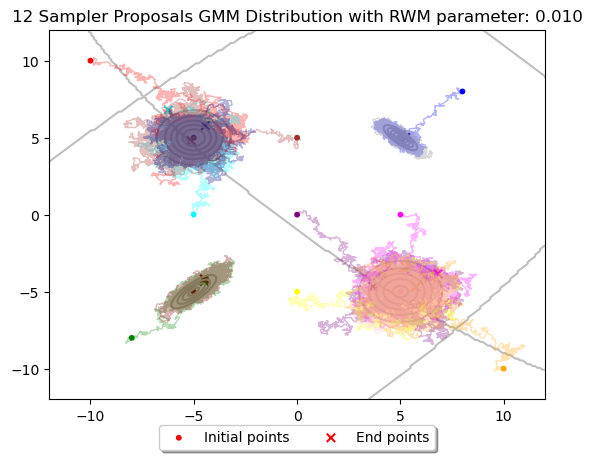

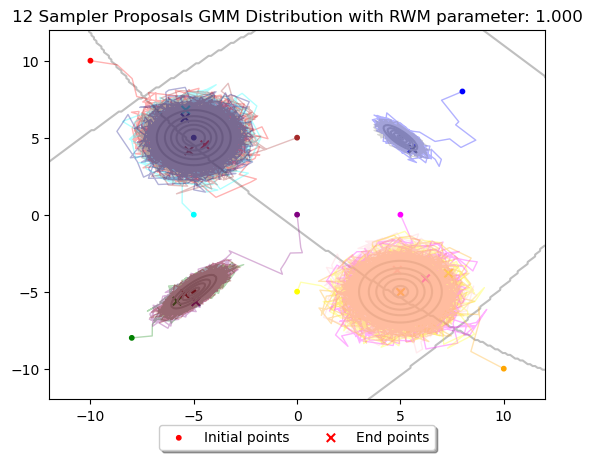

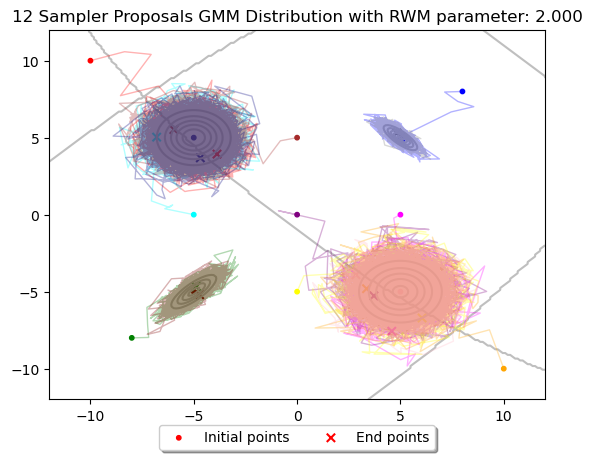

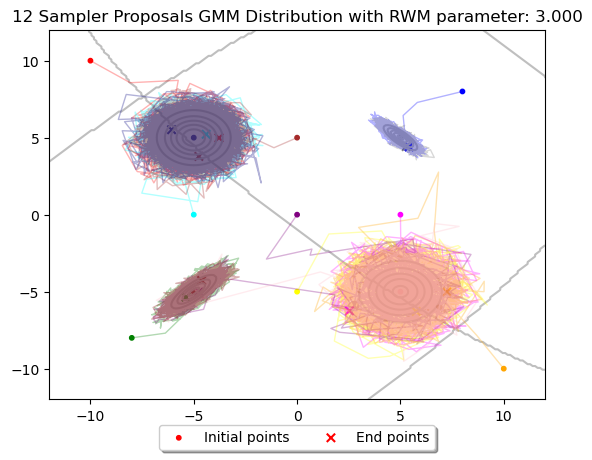

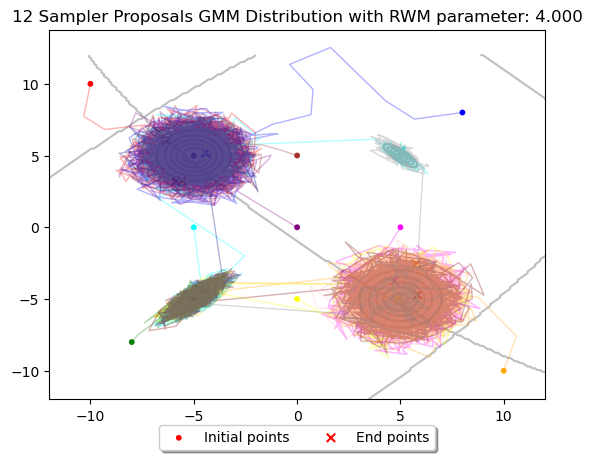

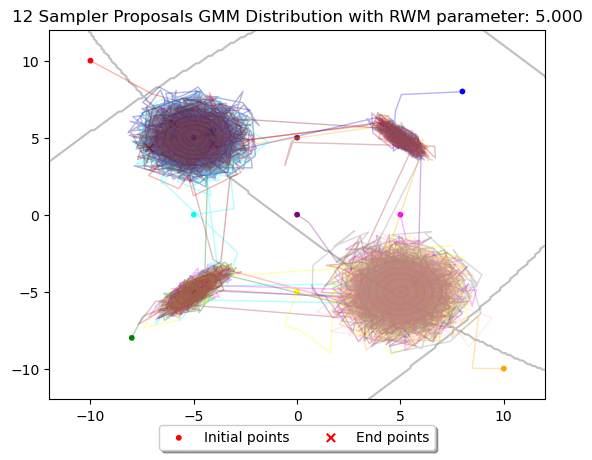

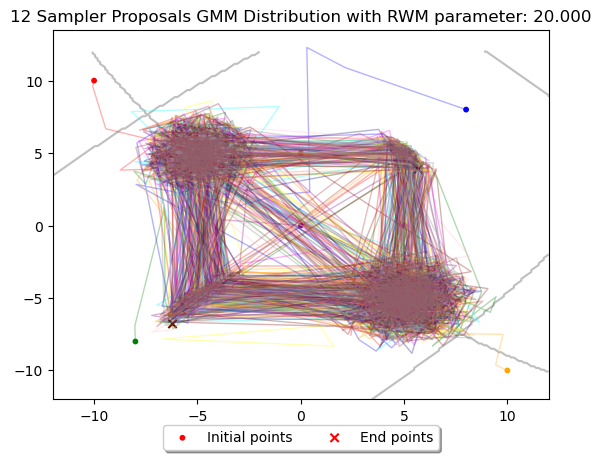

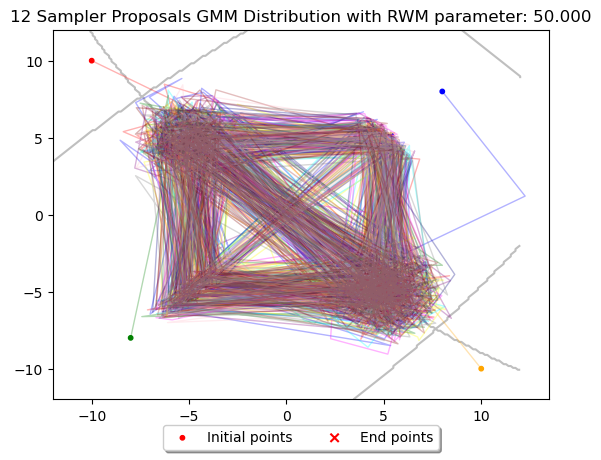

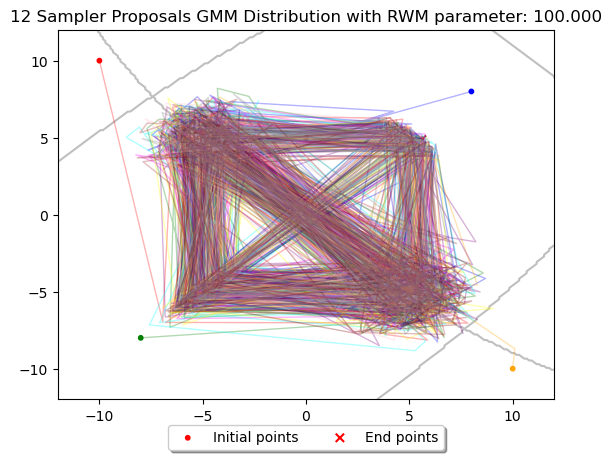

In [32]:
plot_compare(title_gmm, algo_rwm, mus, covs, colors, rwm, c)
#moon_compare(title_moon, algo_rwm, colors, rwm,c)

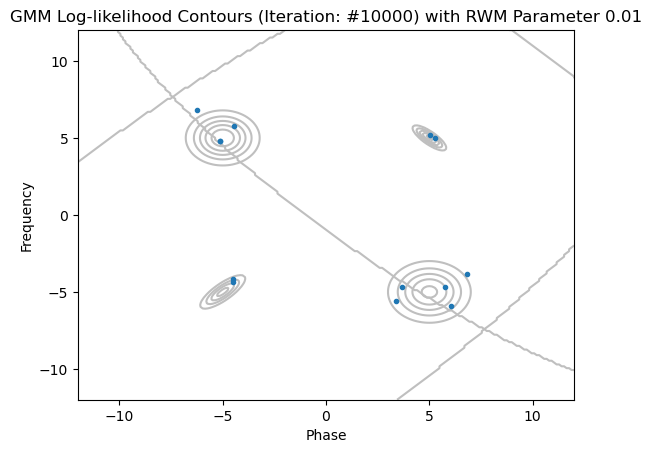

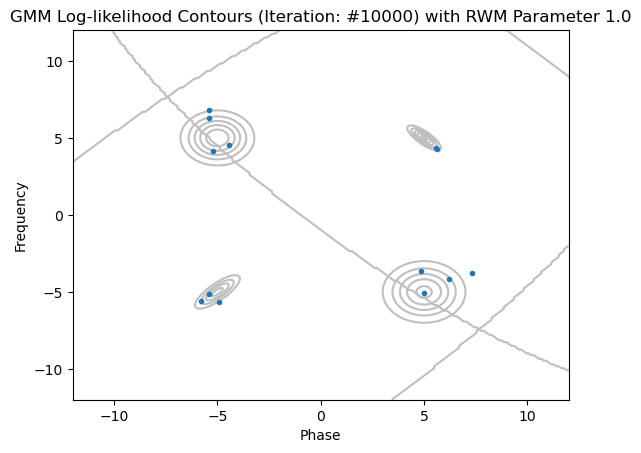

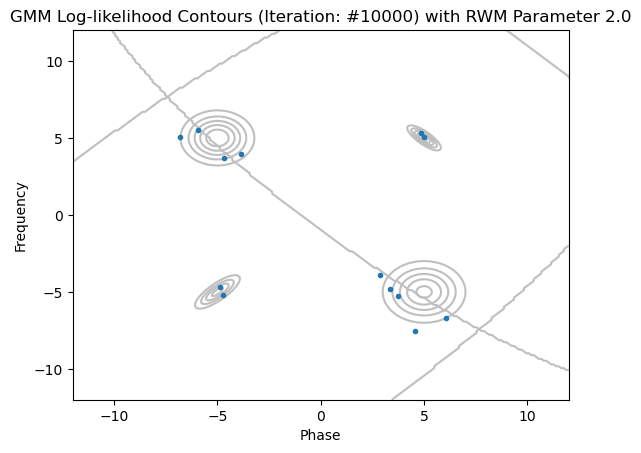

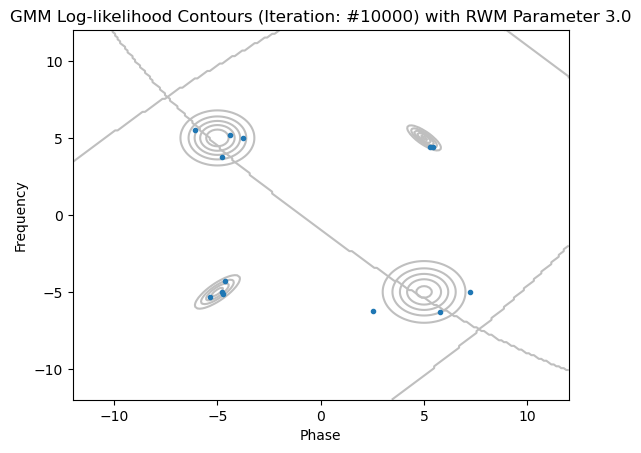

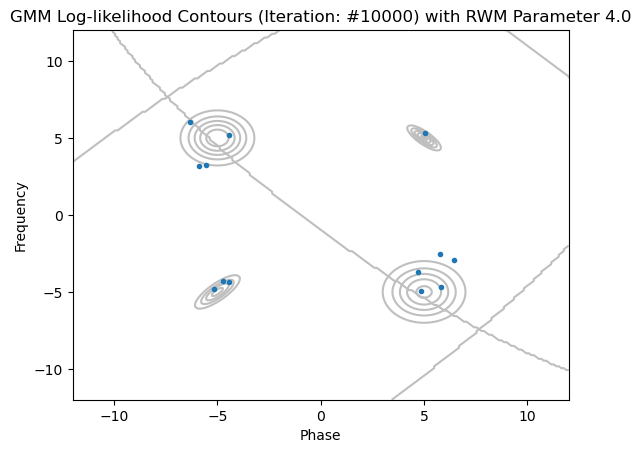

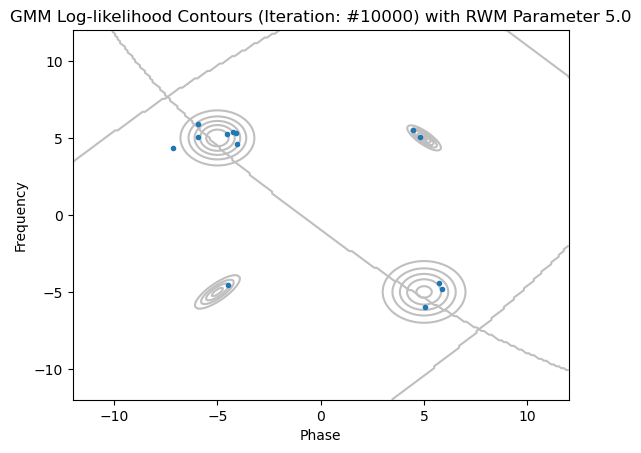

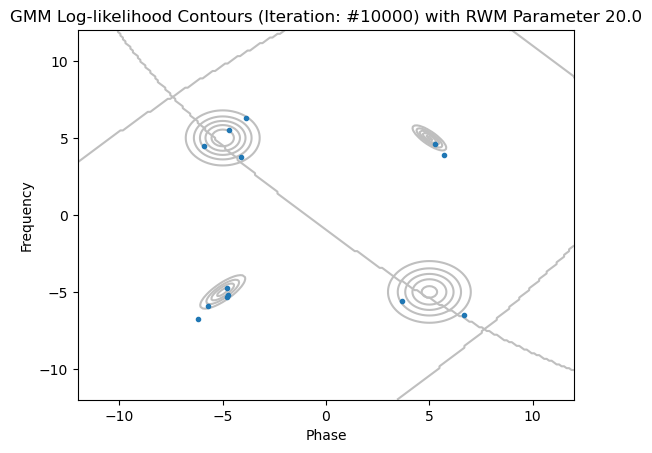

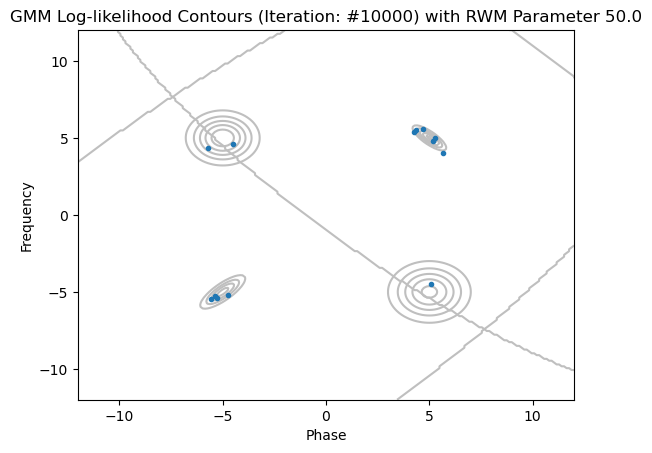

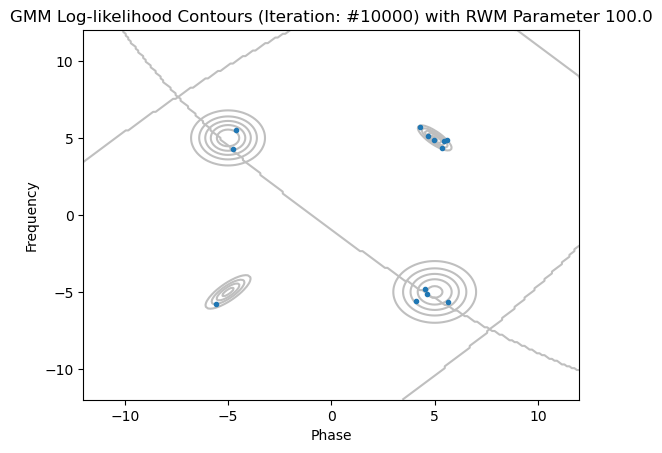

In [33]:
last_iteration(title_gmm, algo_rwm, mus, covs, np.array(rwm).shape[2]-1, rwm, c)
#moon_last_iteration(title_moon, algo_rwm, np.array(rwm).shape[2]-1, rwm, c)

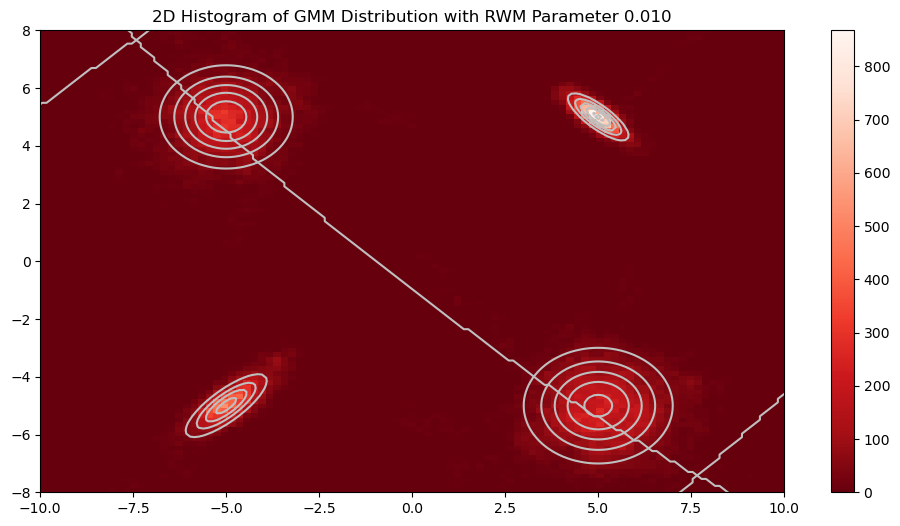

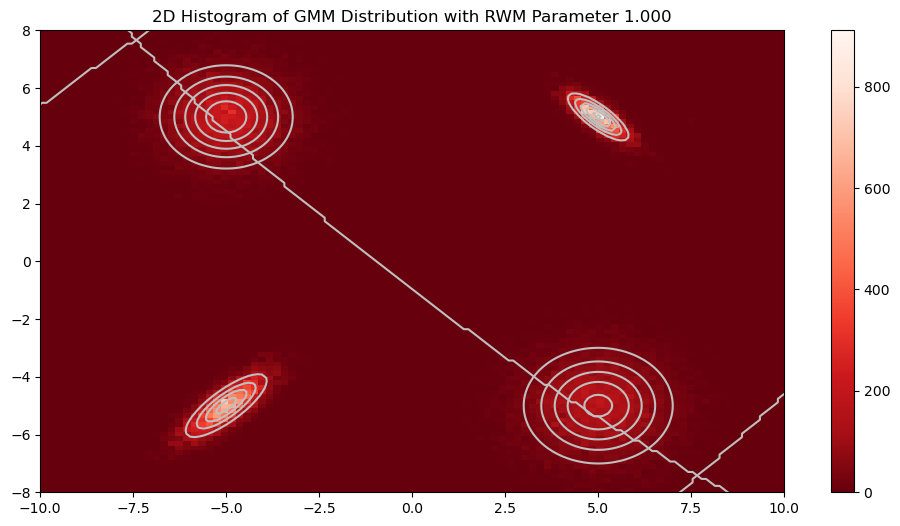

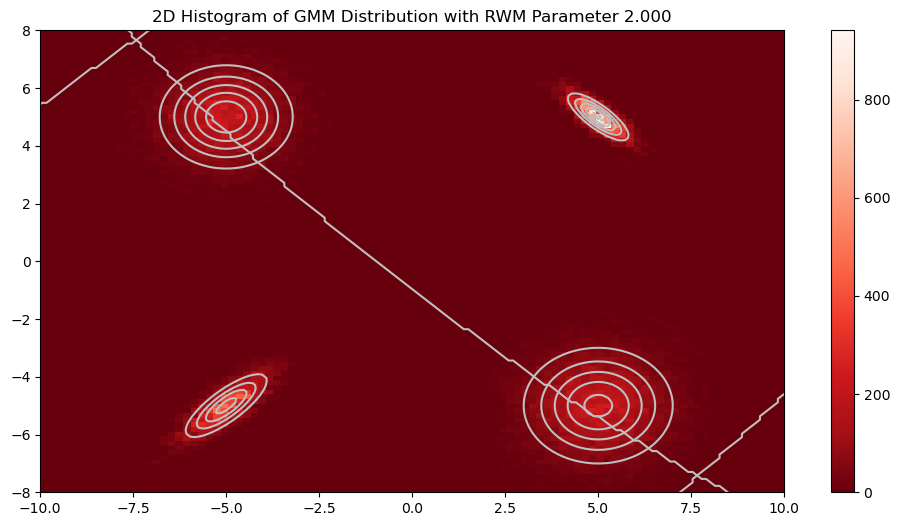

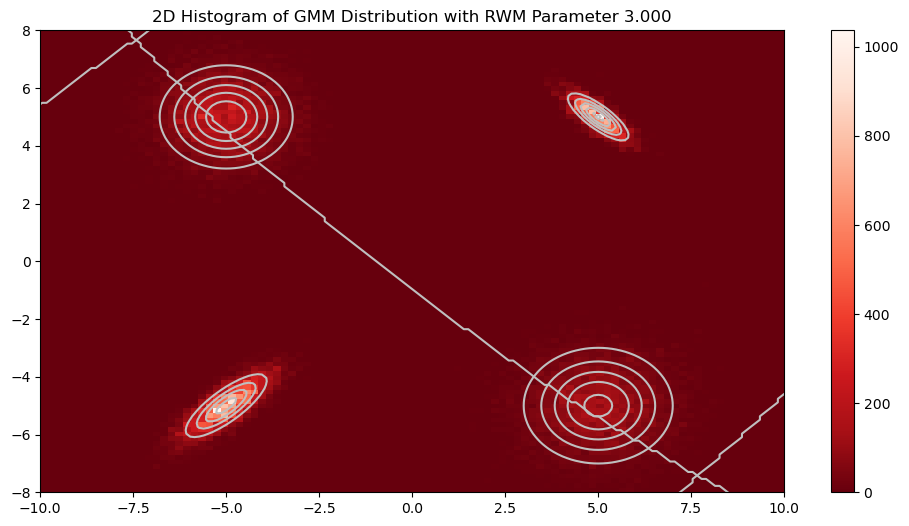

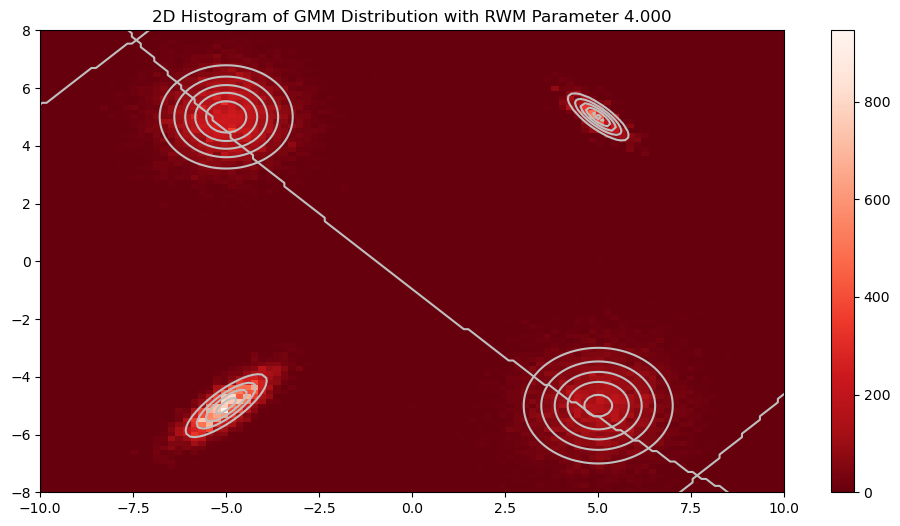

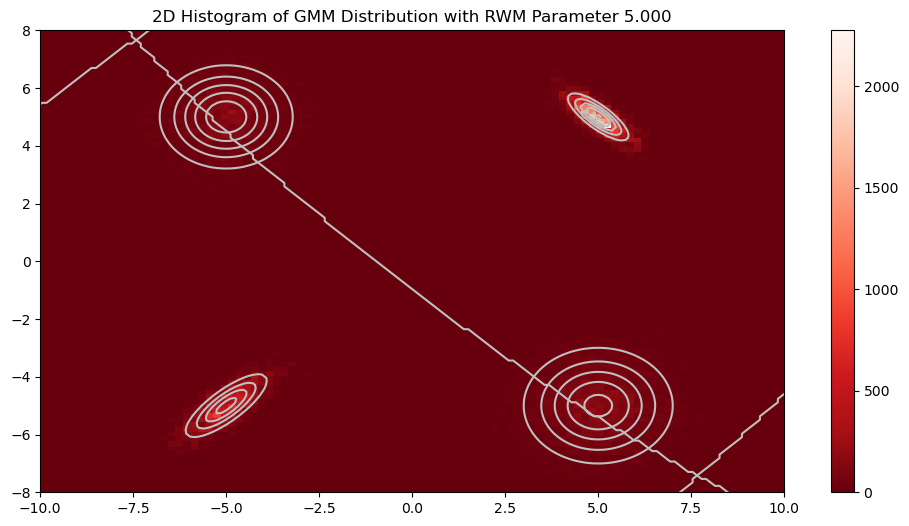

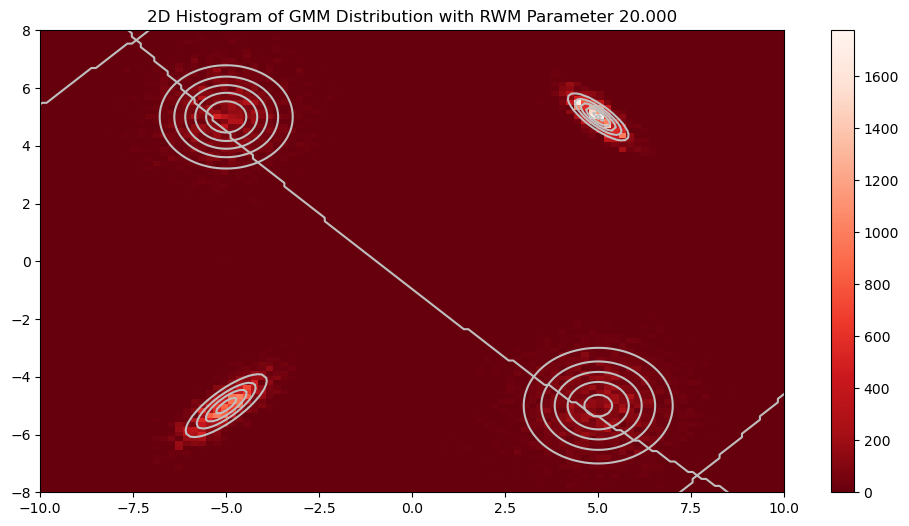

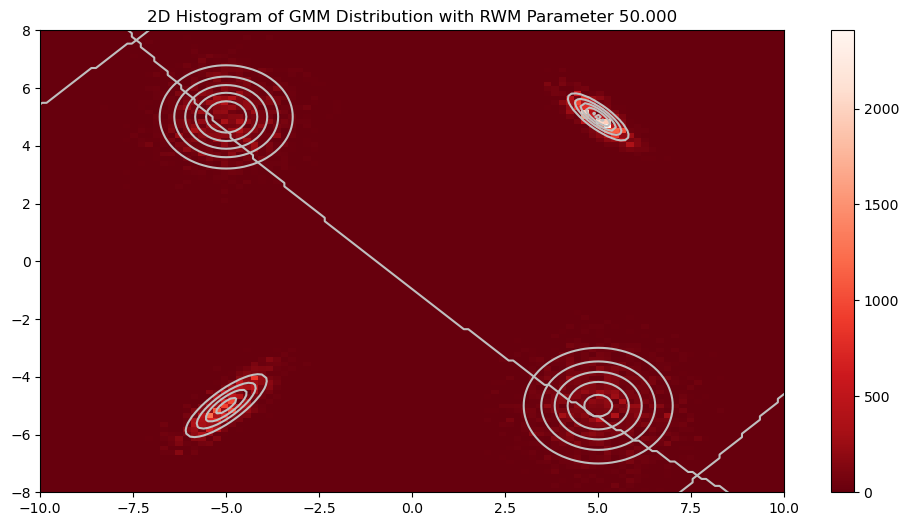

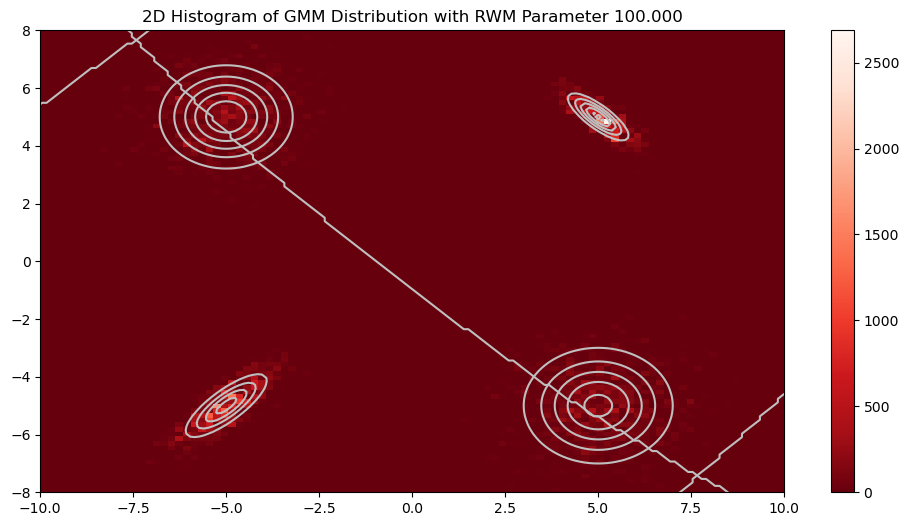

In [34]:
plot_density(title_gmm, algo_rwm, mus, covs, rwm, c)
#moon_density(title_moon, algo_rwm, rwm,c)

# MALA Plot Result

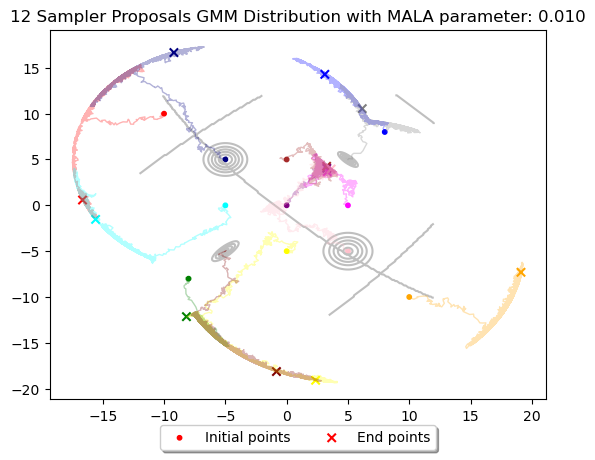

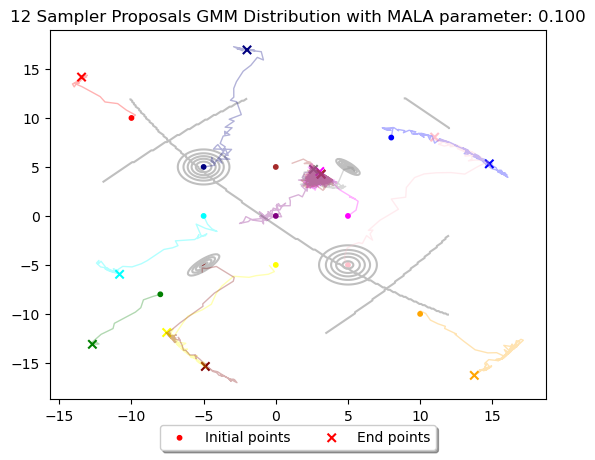

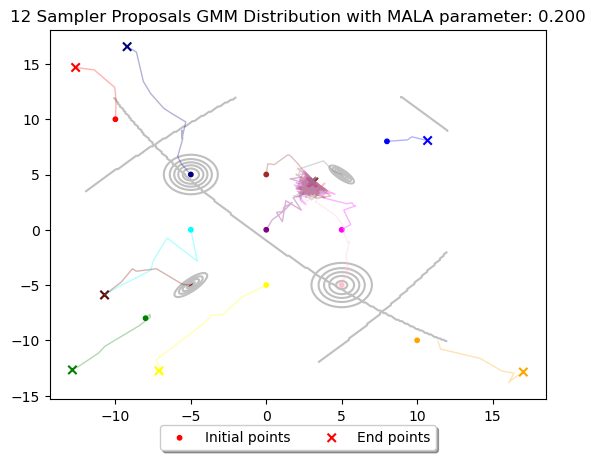

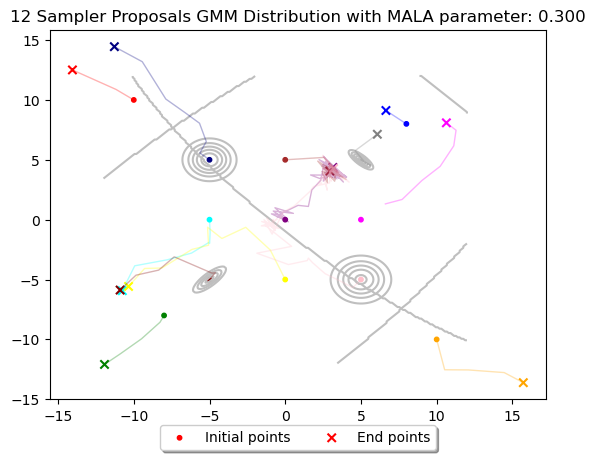

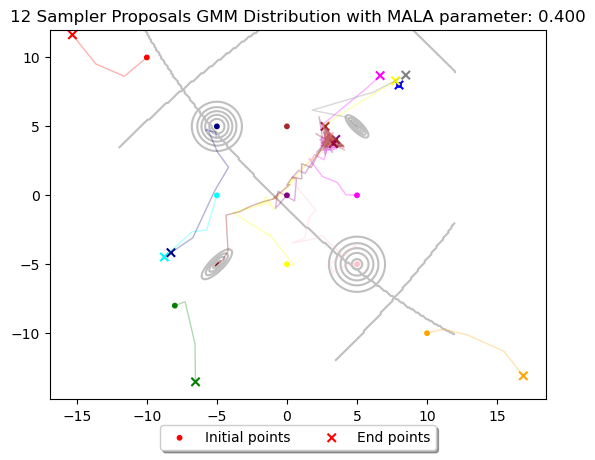

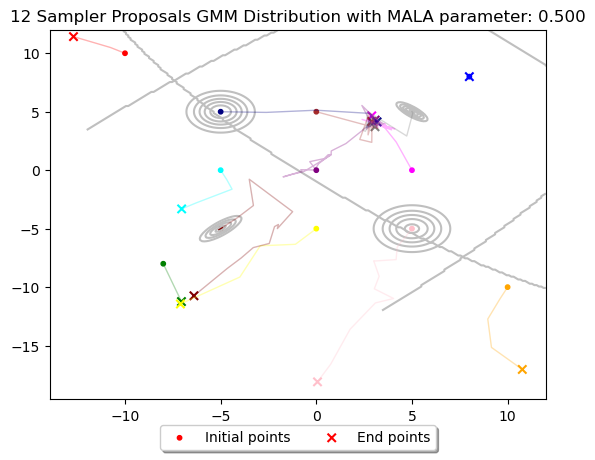

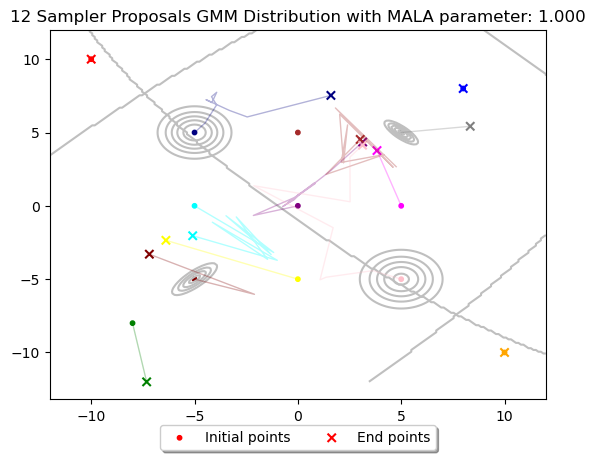

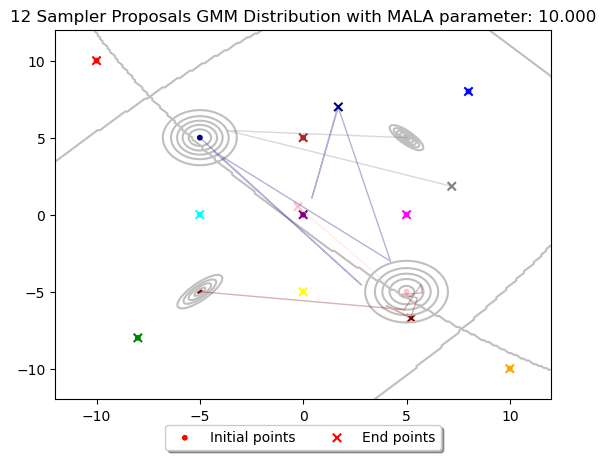

In [35]:
plot_compare(title_gmm, algo_mala, mus,covs,colors,mala,step)
#moon_compare(title_moon, algo_mala, colors, mala, step)

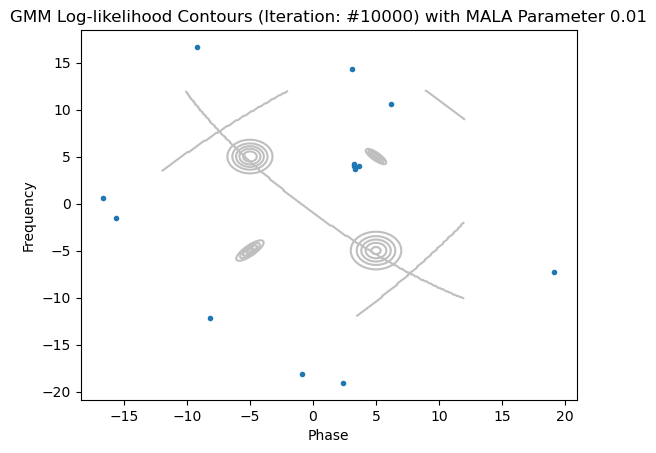

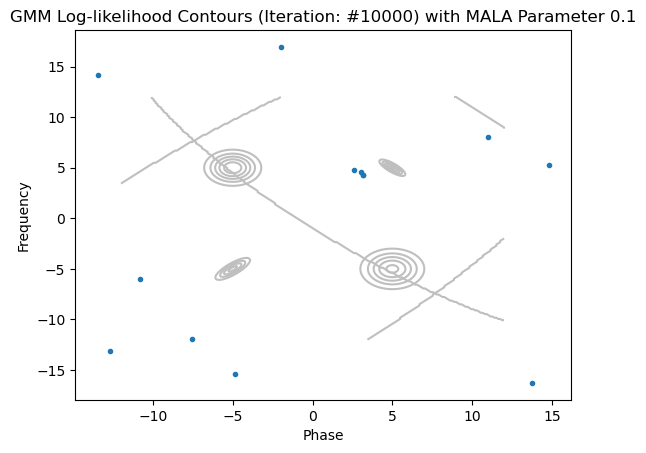

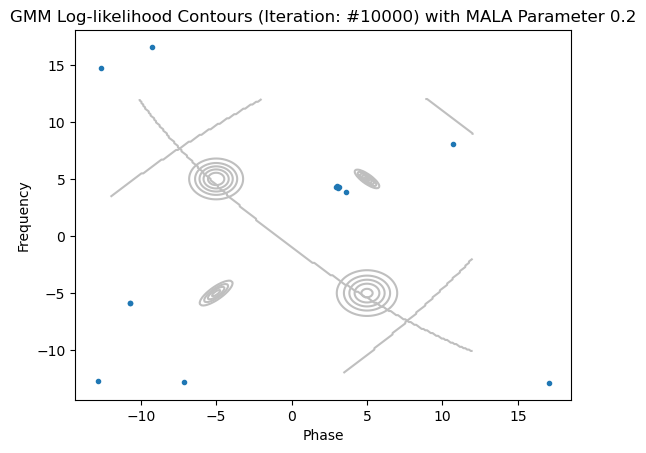

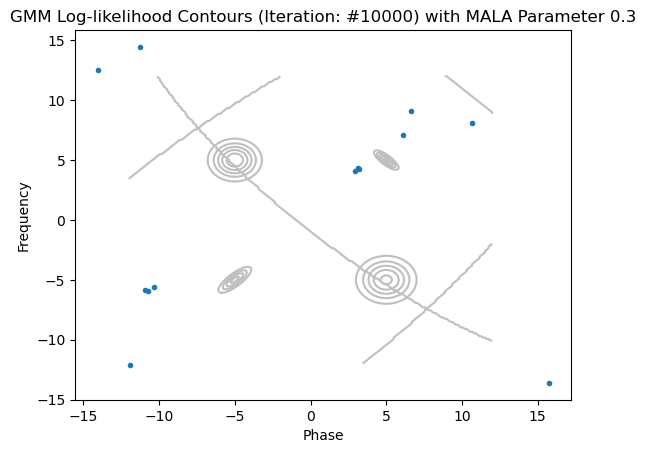

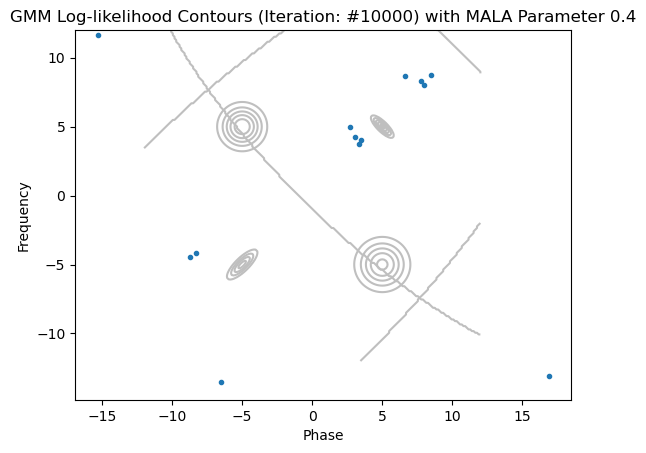

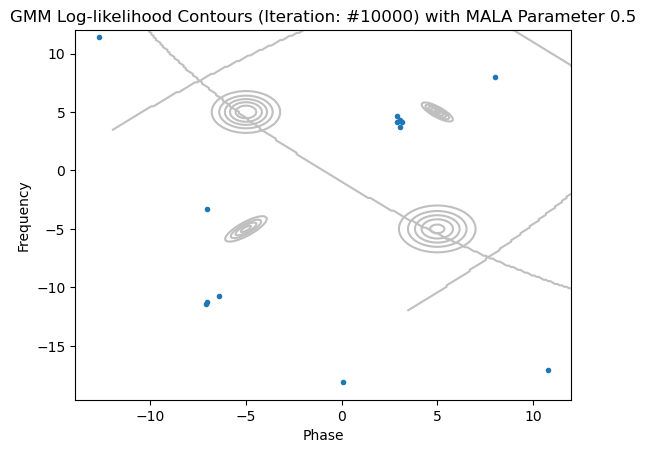

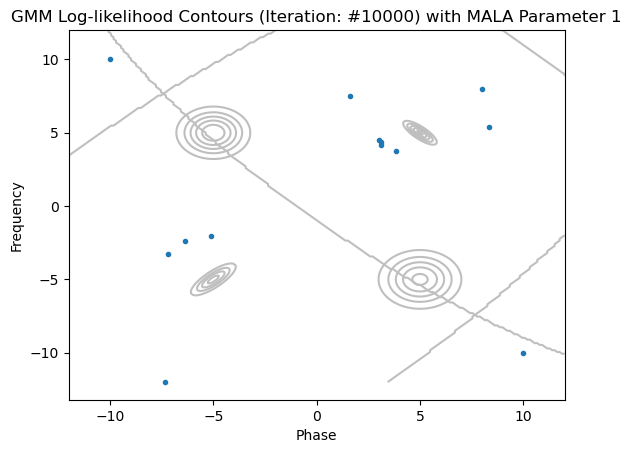

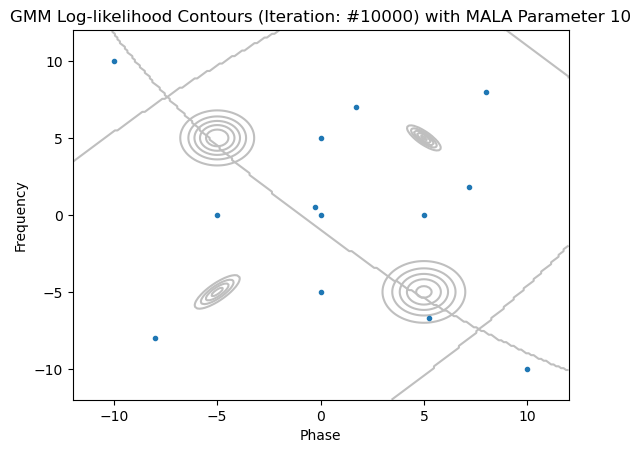

In [36]:
last_iteration(title_gmm, algo_mala, mus, covs, np.array(mala).shape[2]-1, mala, step)
#moon_last_iteration(title_moon, algo_mala, np.array(mala).shape[2]-1, mala, step)

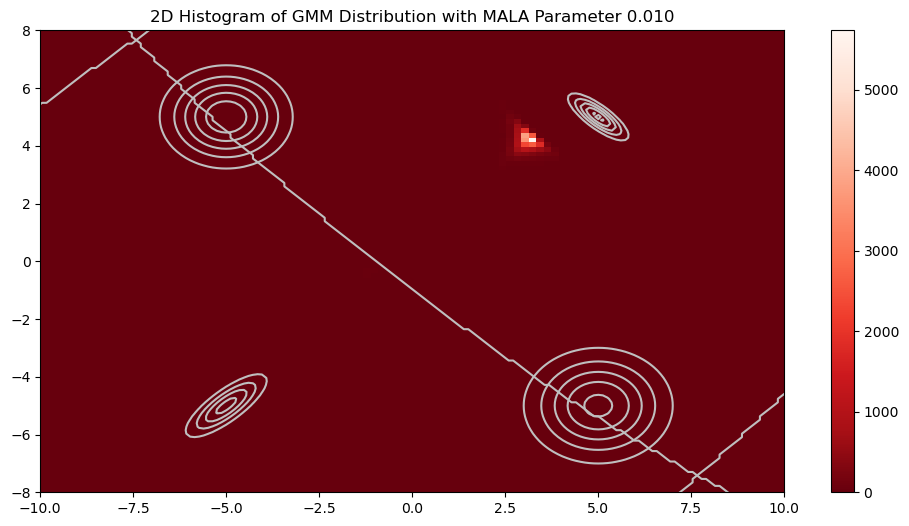

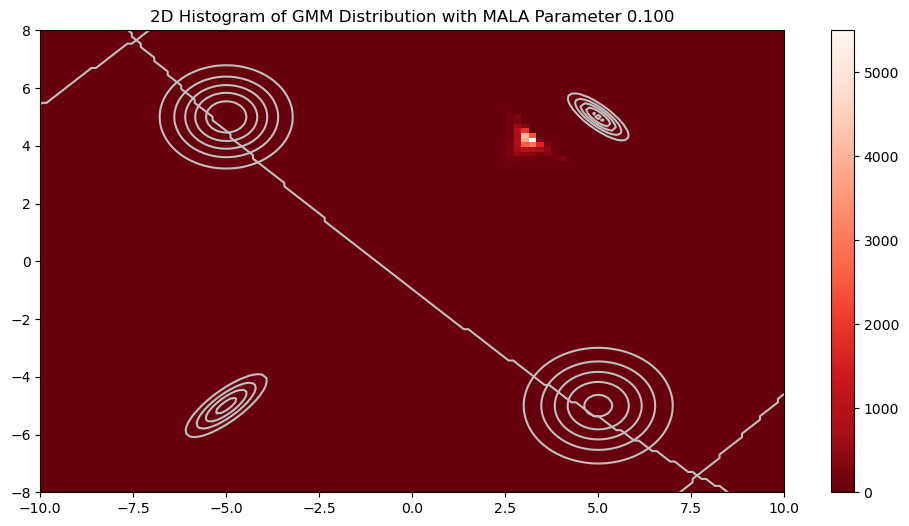

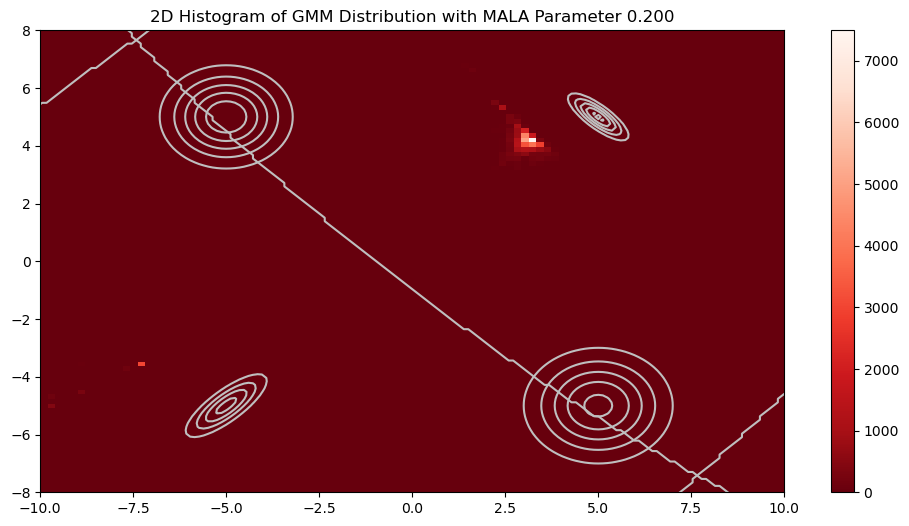

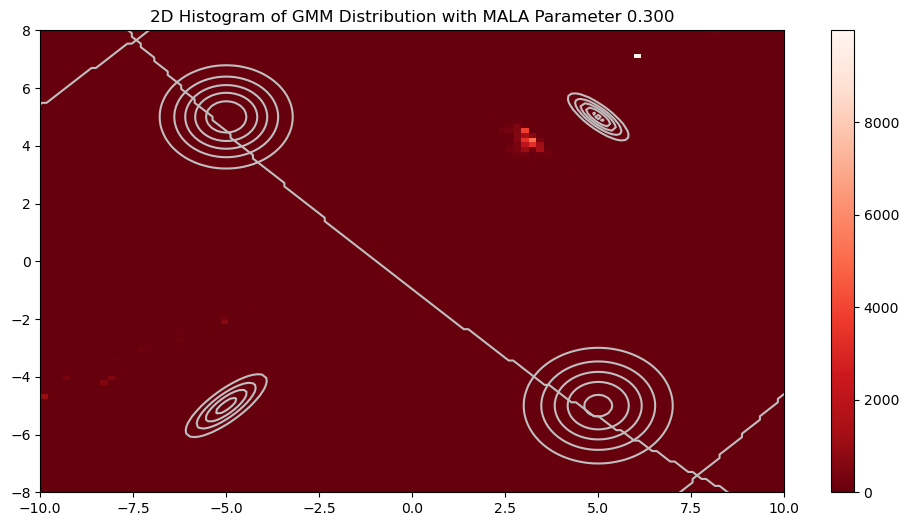

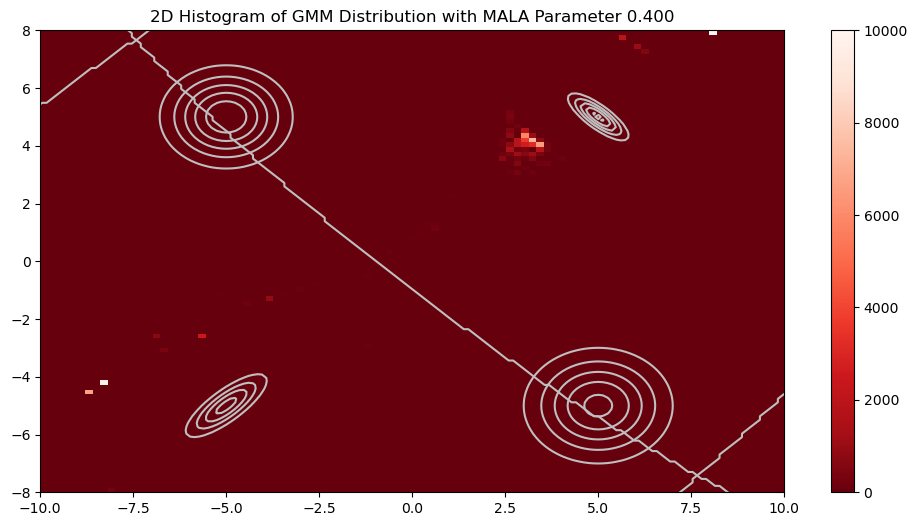

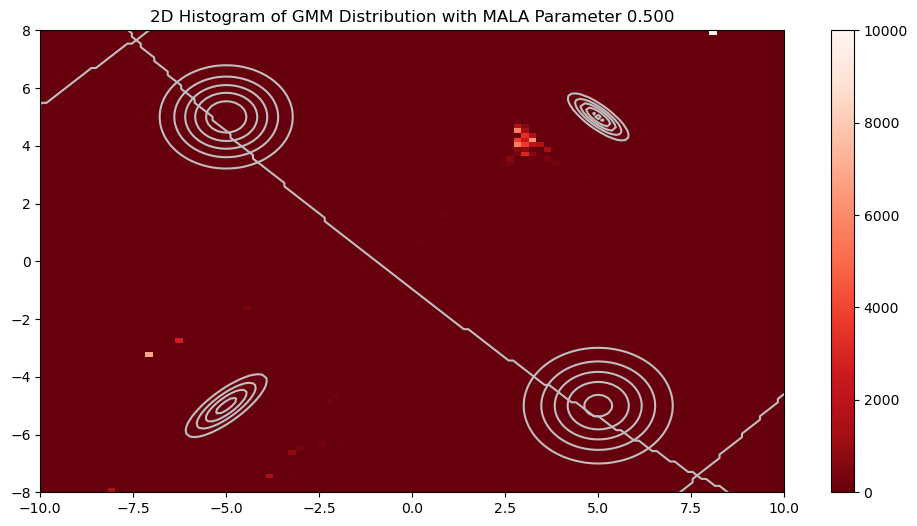

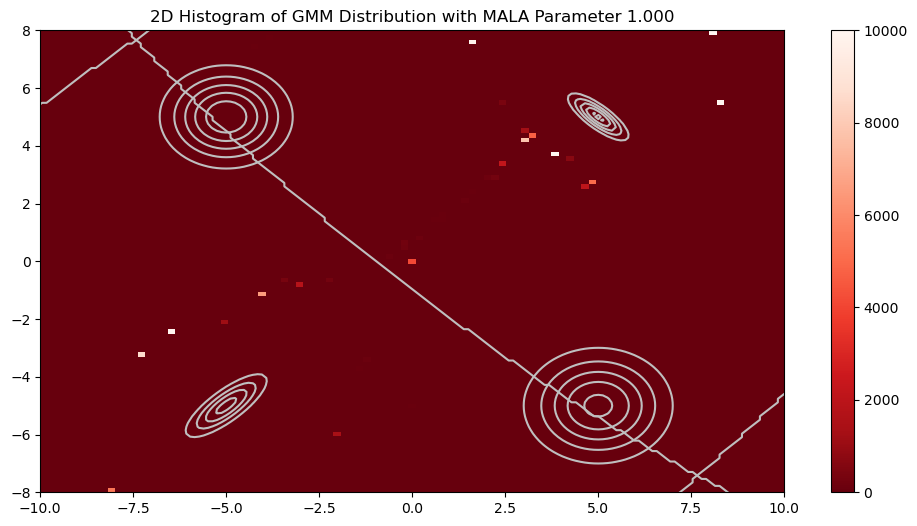

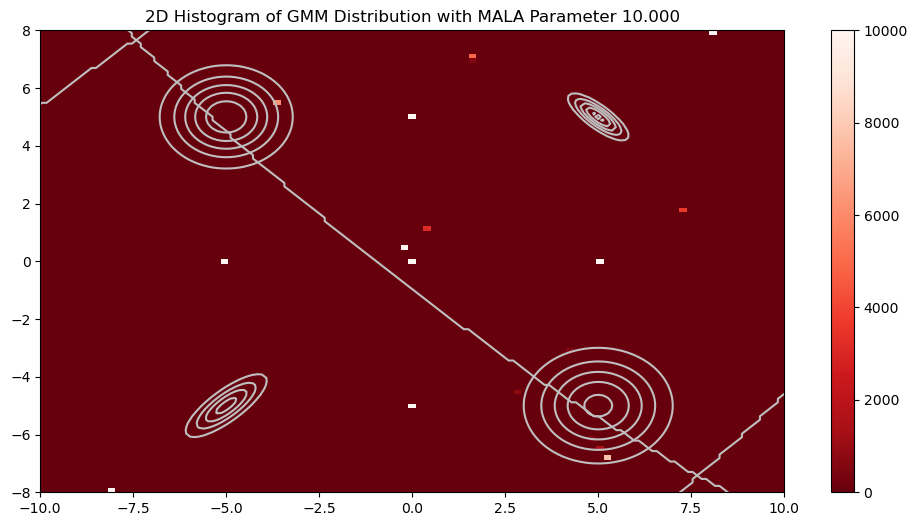

In [44]:
plot_density(title_gmm, algo_mala, mus, covs, mala, step)
#moon_density(title_moon, algo_mala, mala,step)

# Hamiltonian Monte Carlo Plot Result

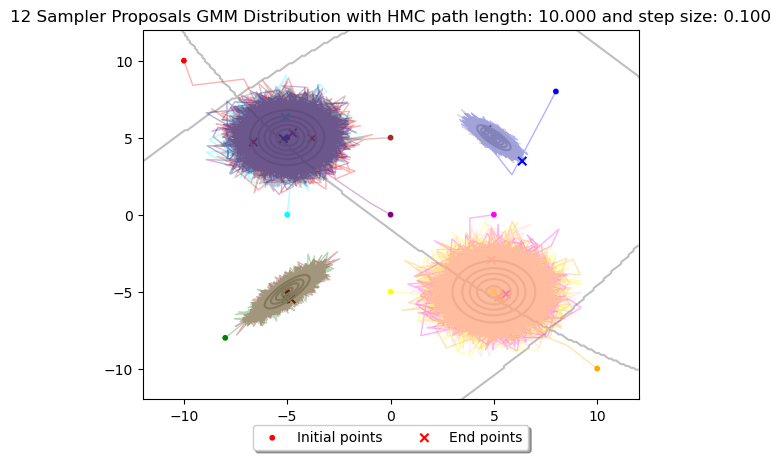

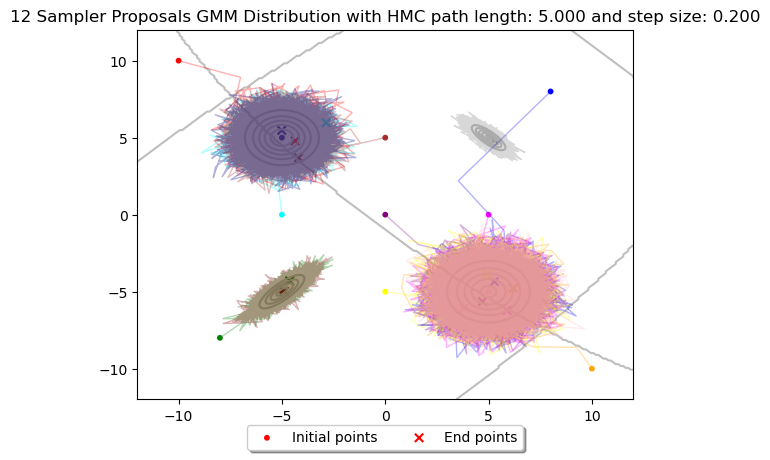

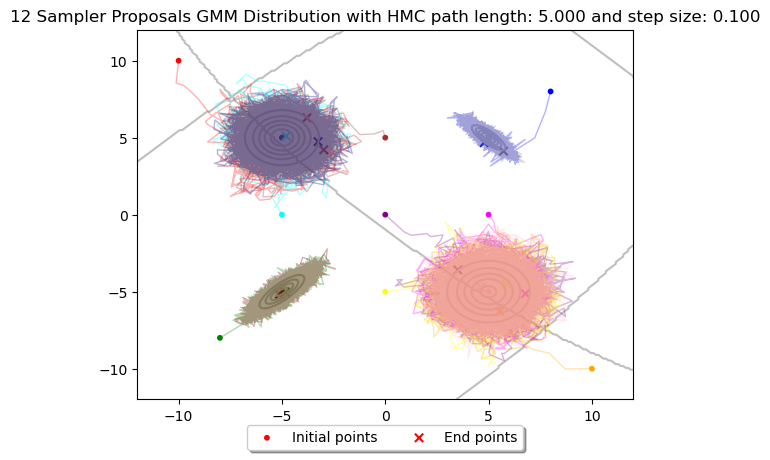

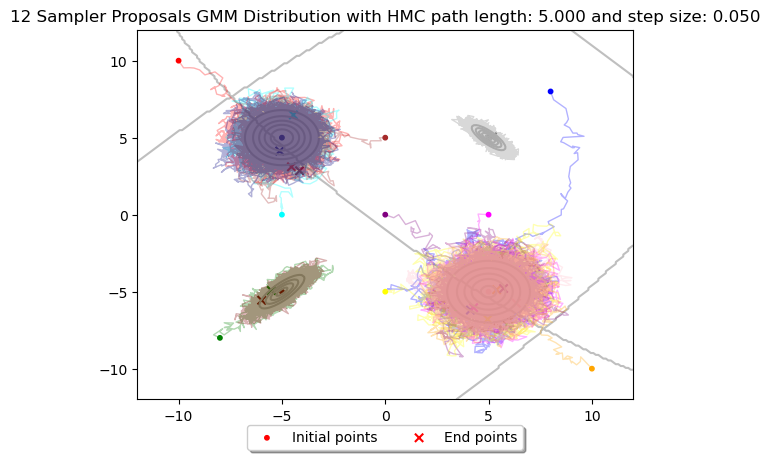

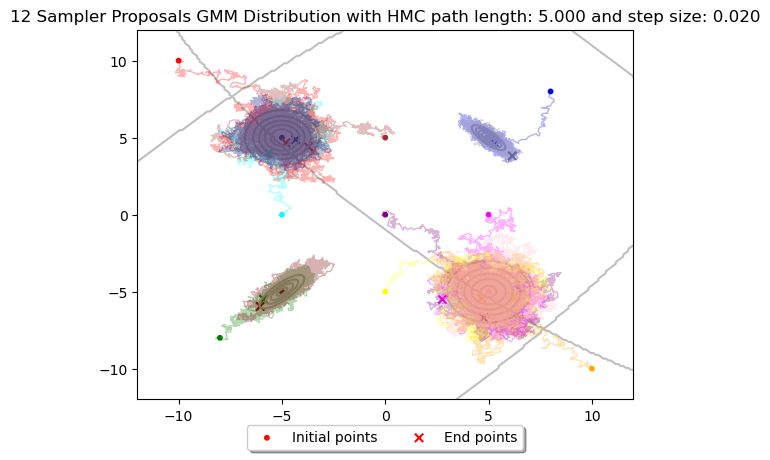

...

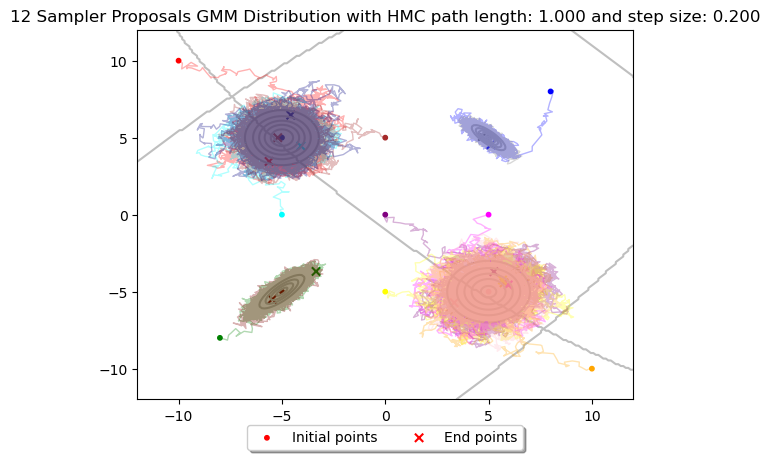

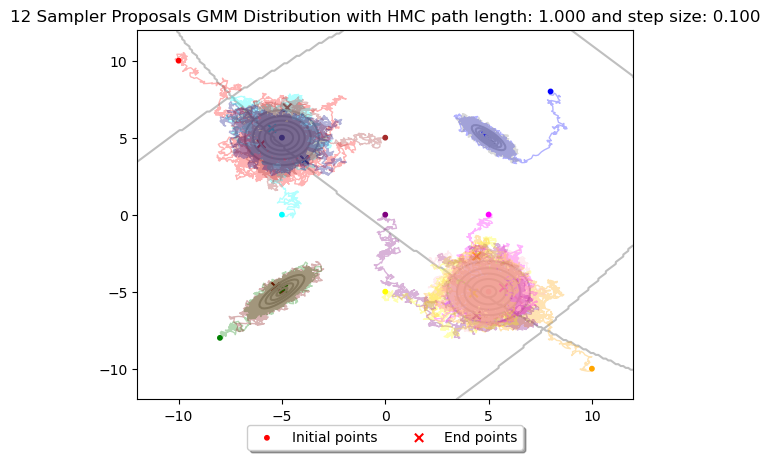

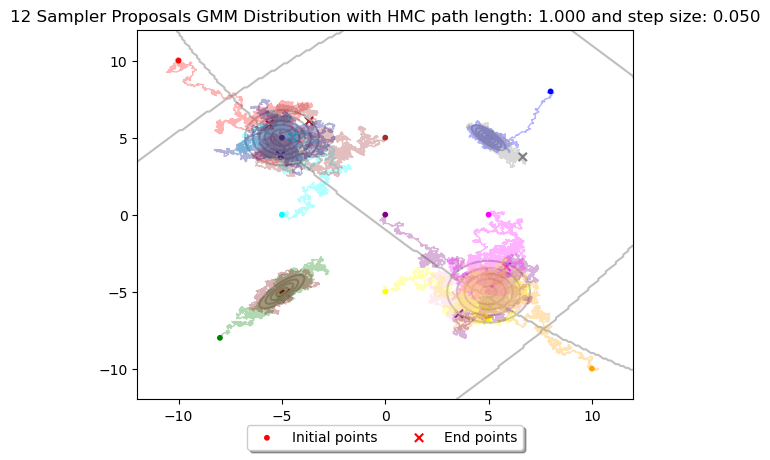

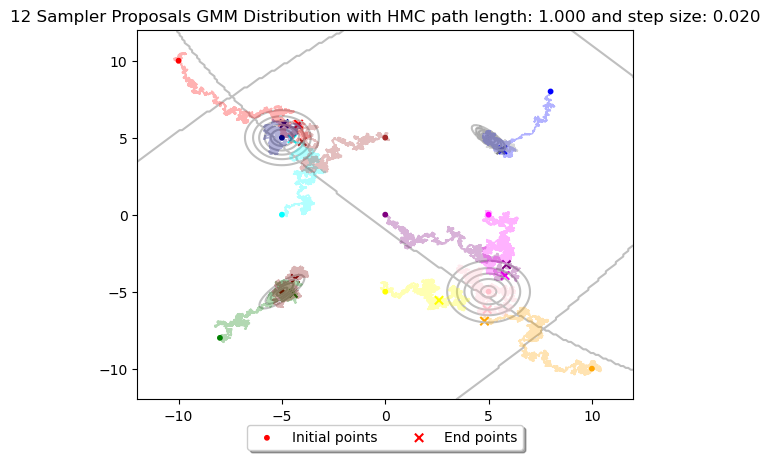

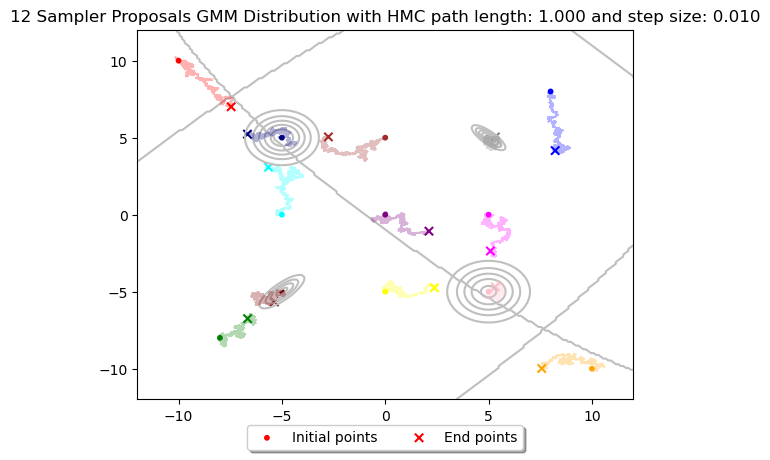

In [45]:
plot_compare2(title_gmm, algo_hmc, mus, covs, colors, hmc, T, eps)
#moon_compare2(title_moon, algo_hmc, colors, hmc, T, eps)

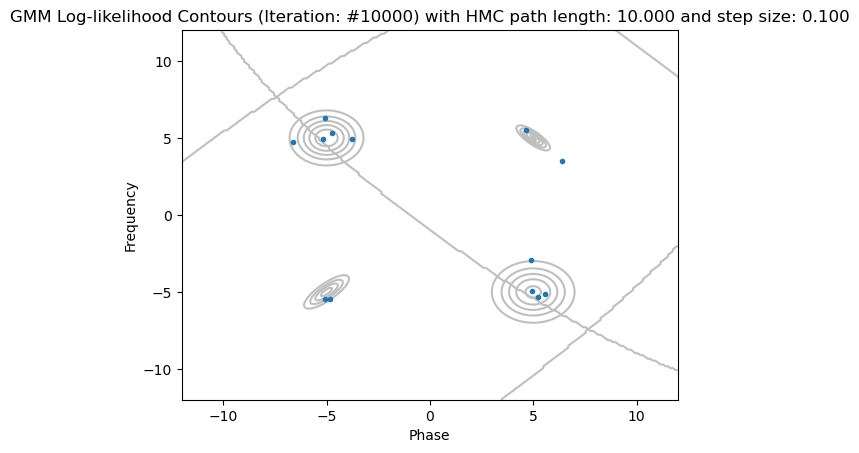

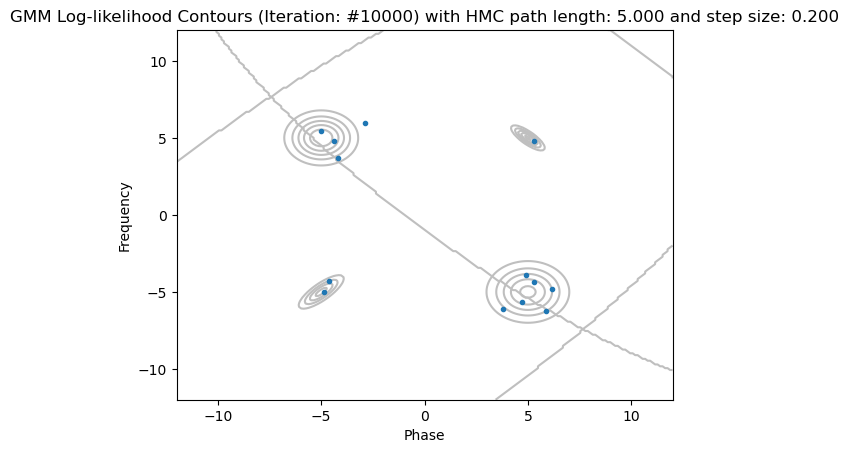

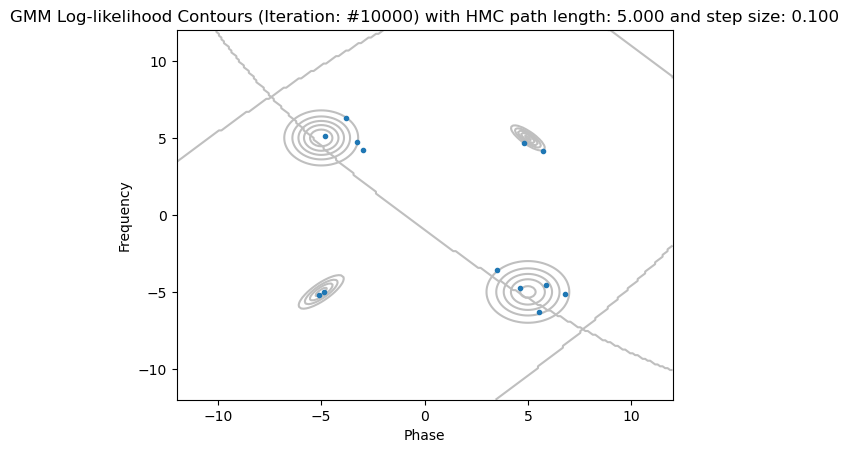

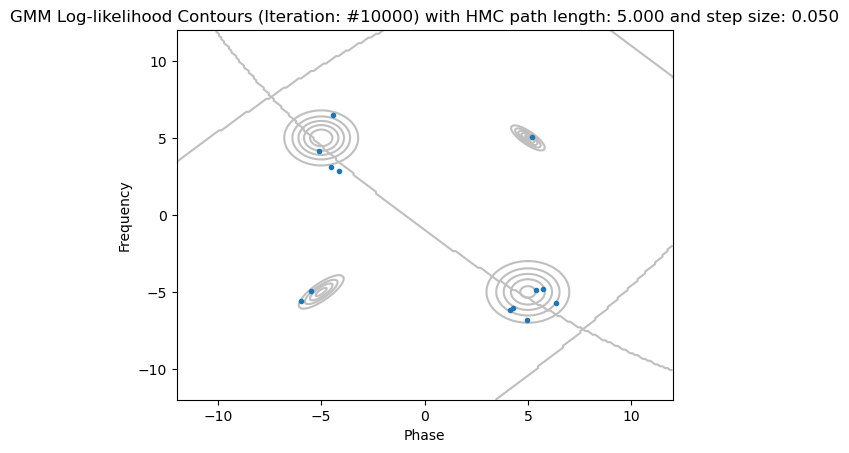

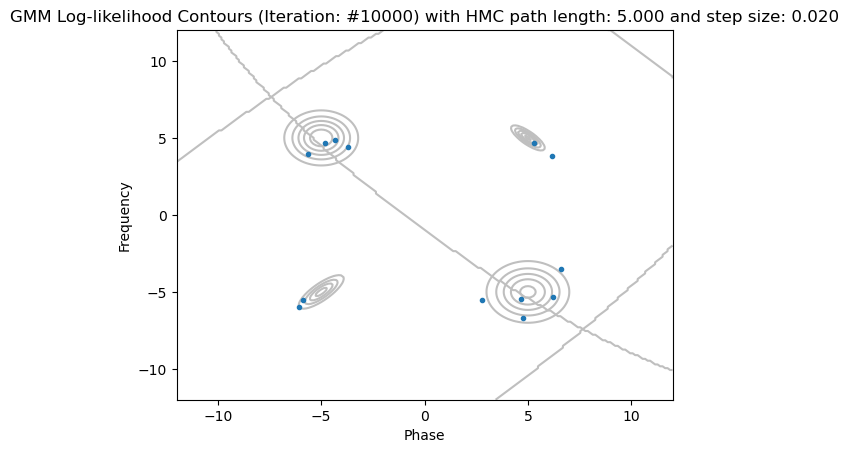

...

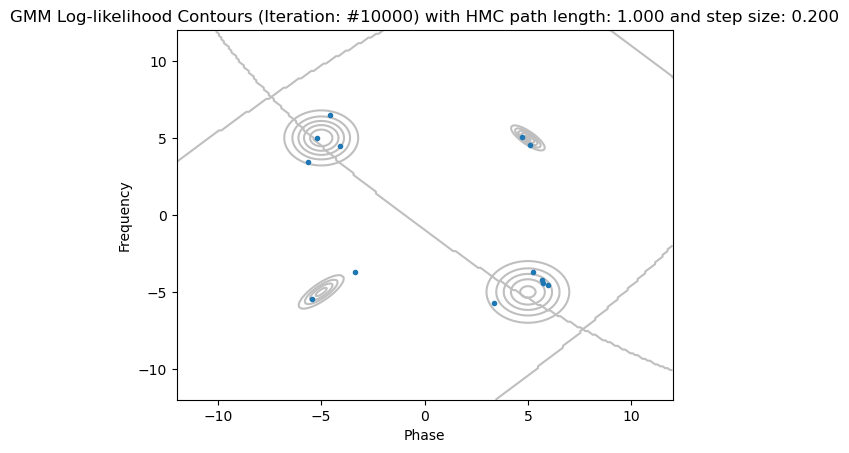

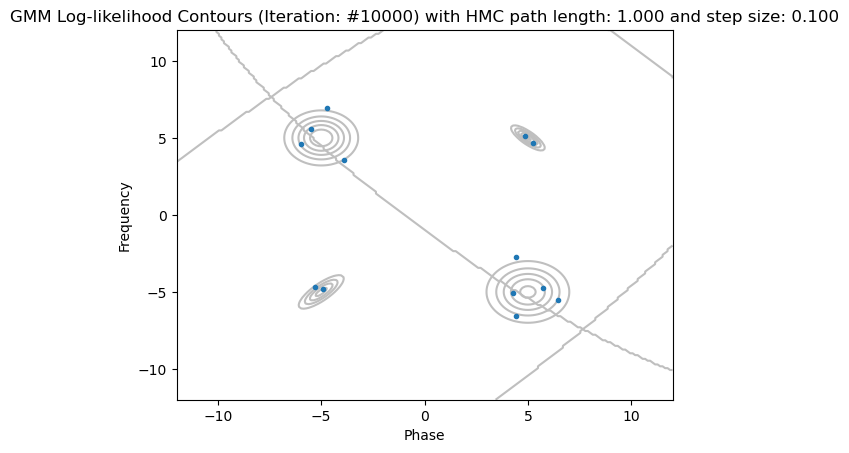

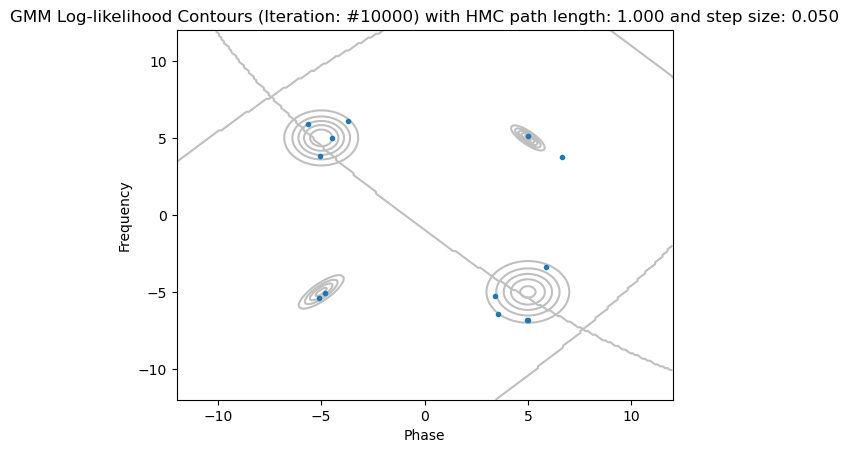

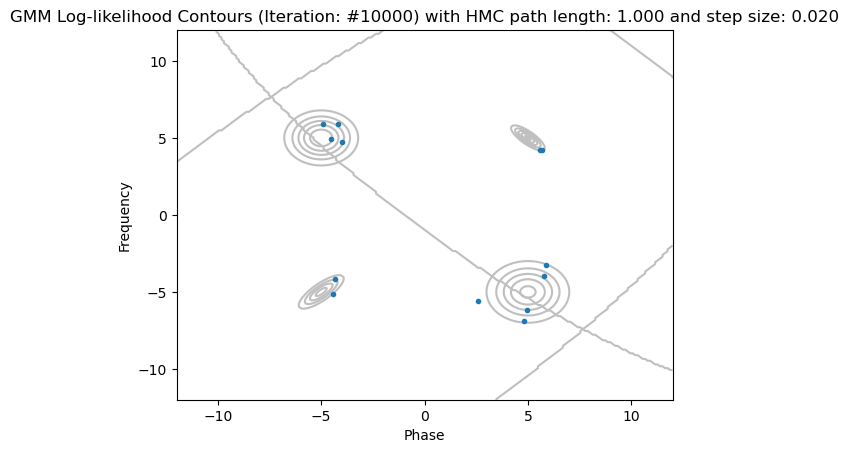

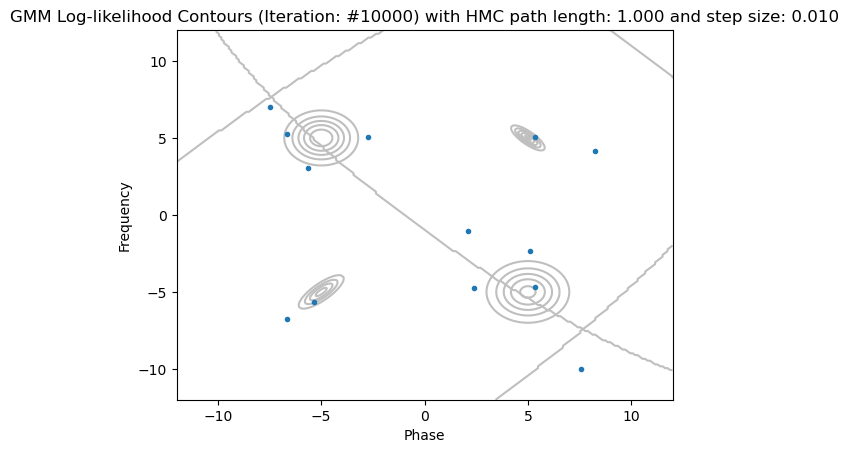

In [46]:
last_iteration2(title_gmm, algo_hmc, mus, covs, np.array(hmc).shape[1]-1, hmc, T, eps)
#moon_last_iteration2(title_moon, algo_hmc, np.array(hmc).shape[1]-1, hmc, T, eps)

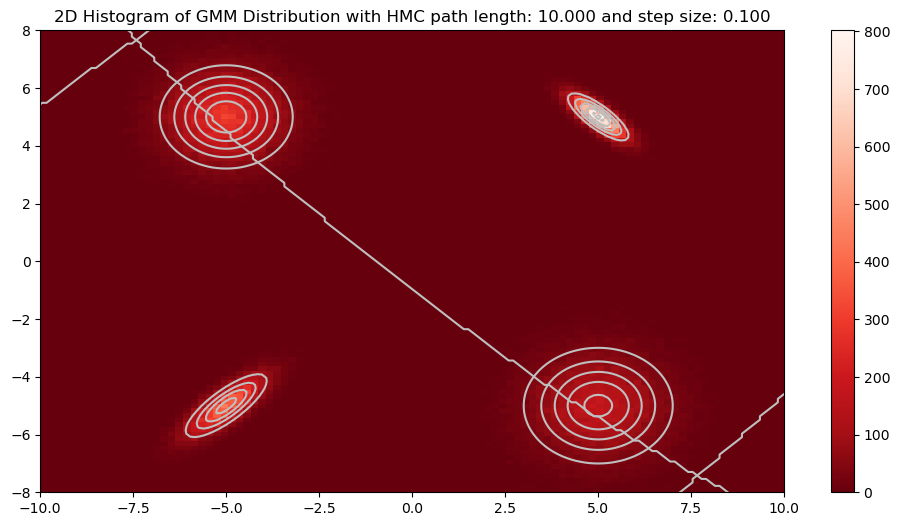

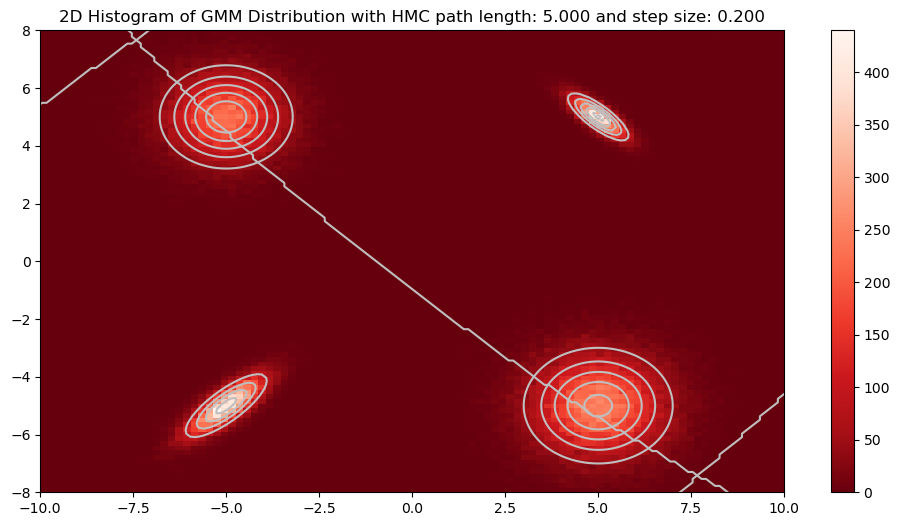

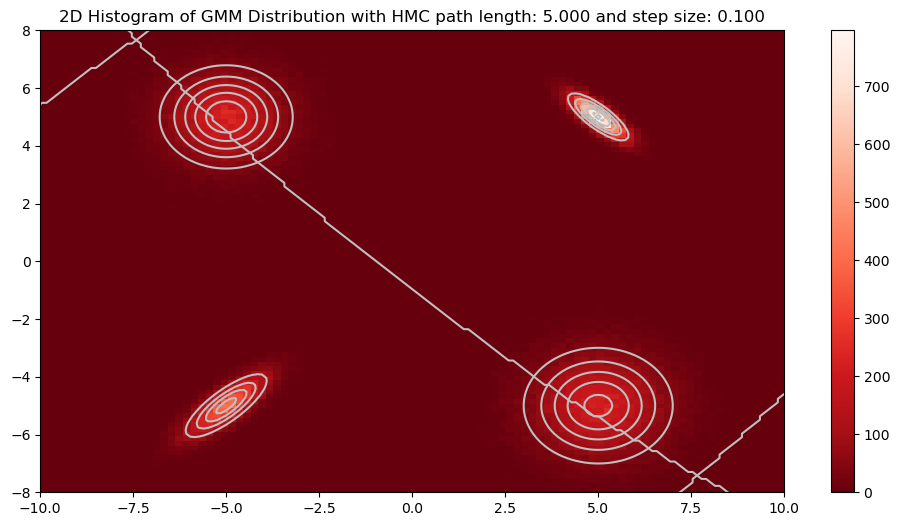

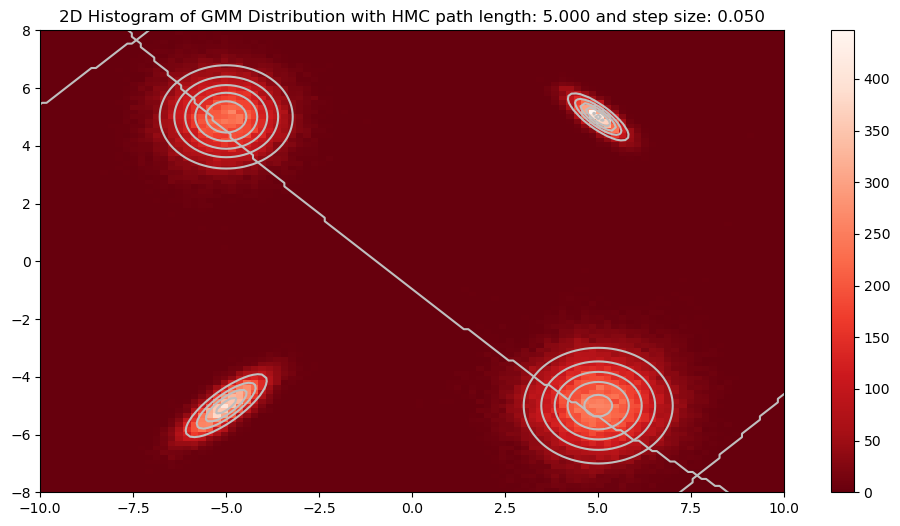

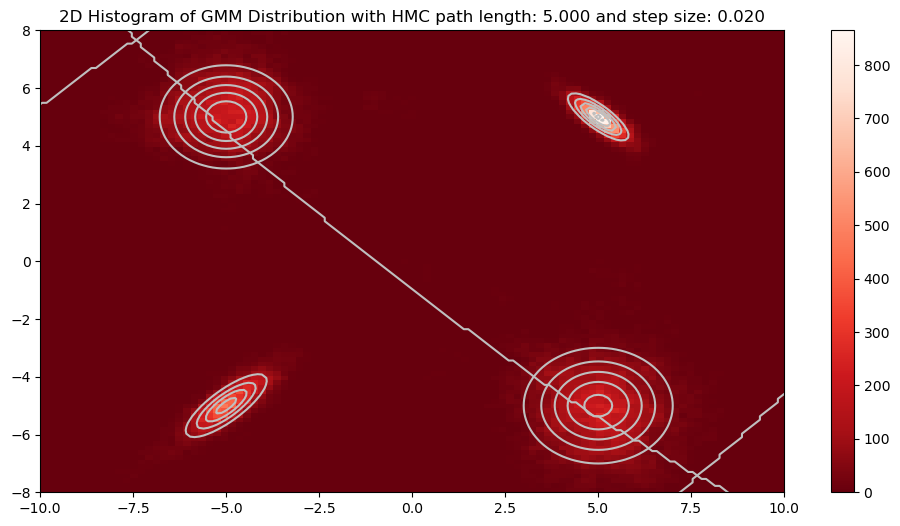

...

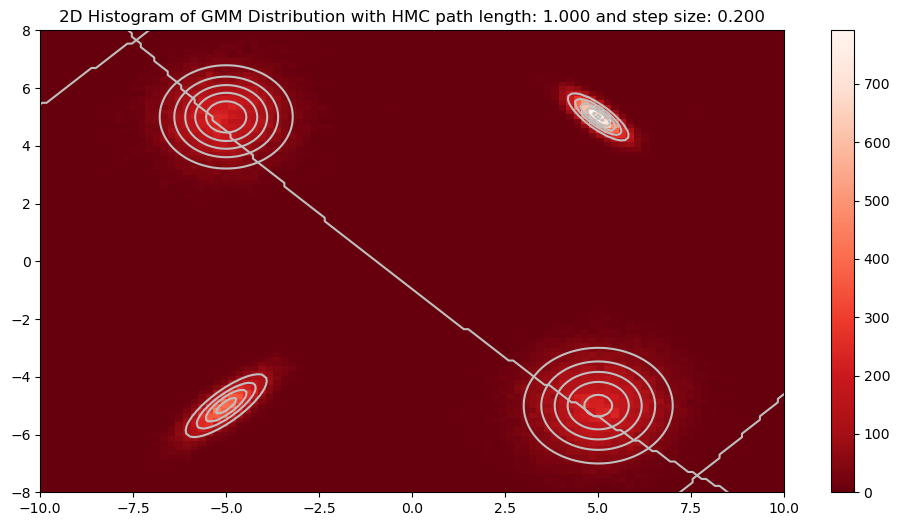

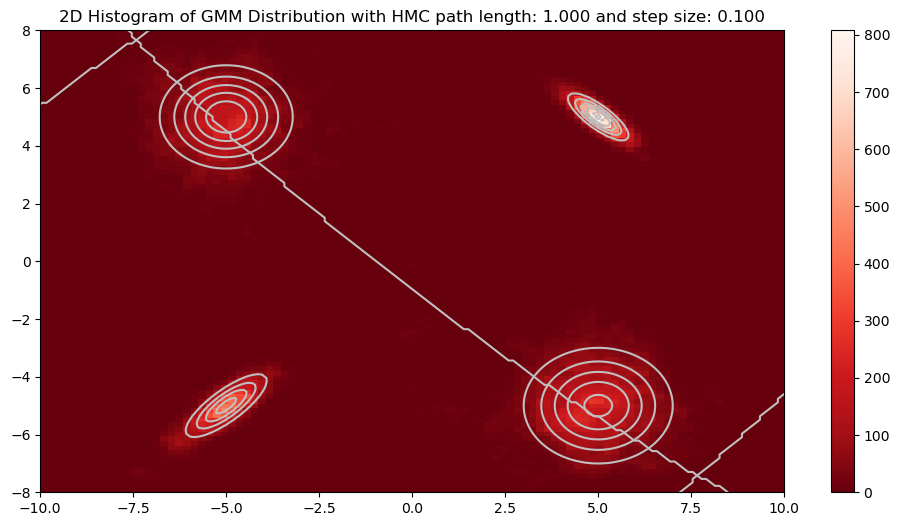

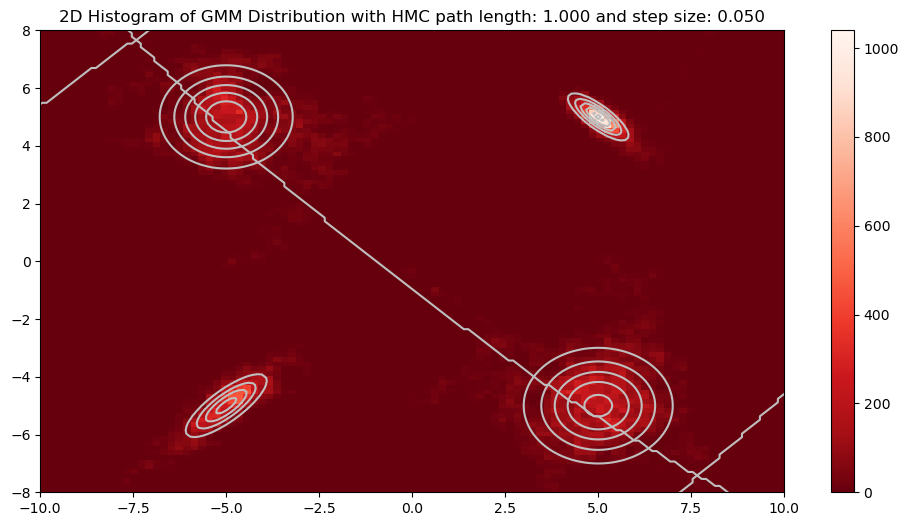

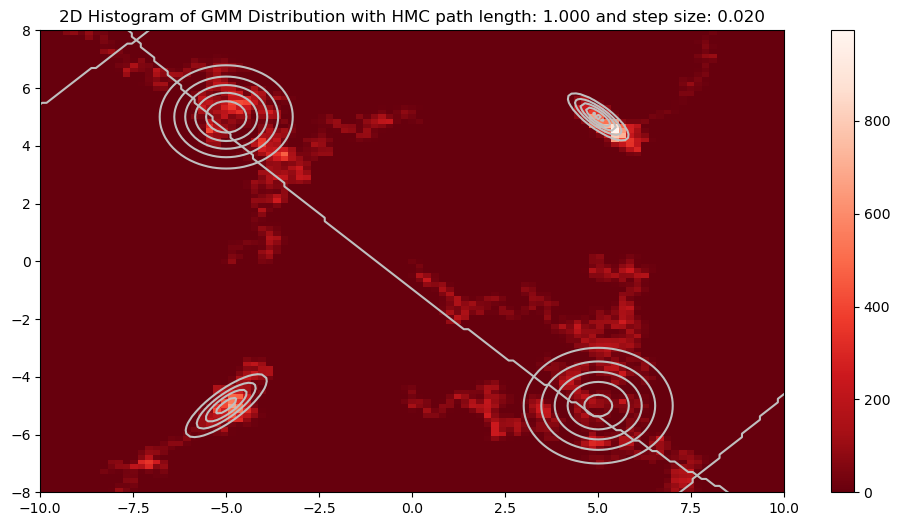

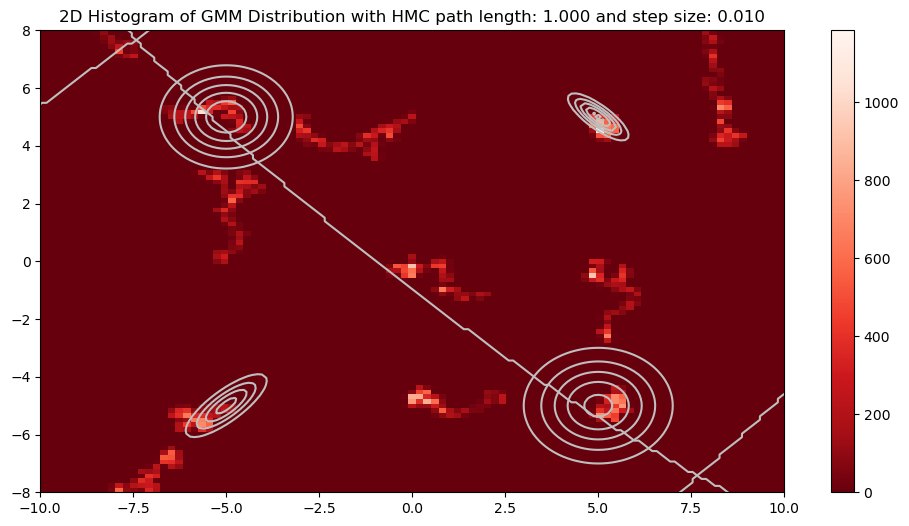

In [47]:
plot_density2(title_gmm, algo_hmc, mus, covs, hmc, T, eps)
#moon_density2(title_moon, algo_hmc, hmc, T, eps)

# Learning 2 Hamiltonian Monte Carlo Plot Result

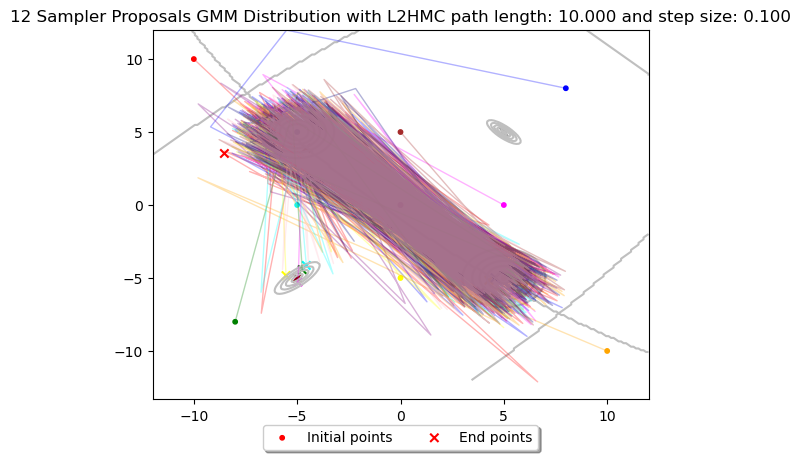

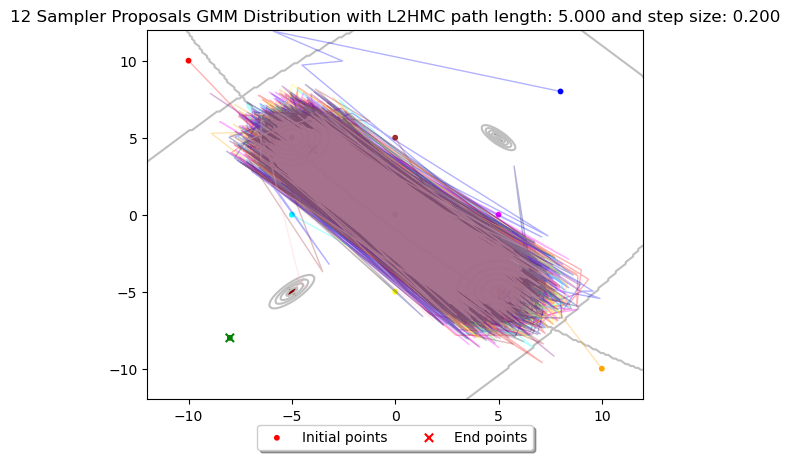

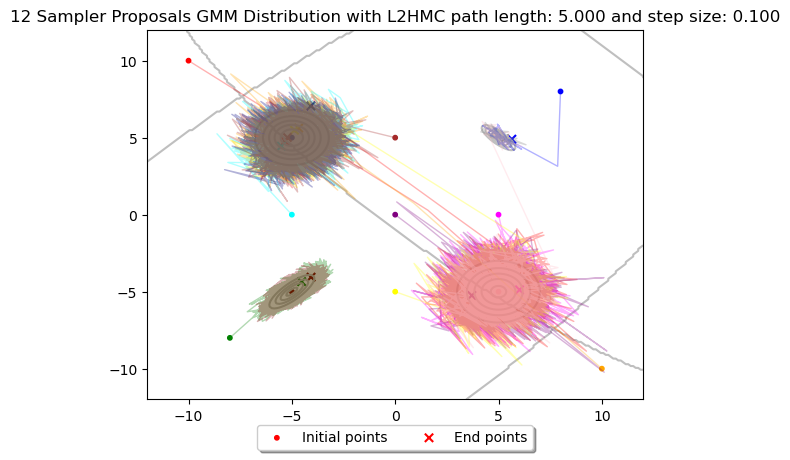

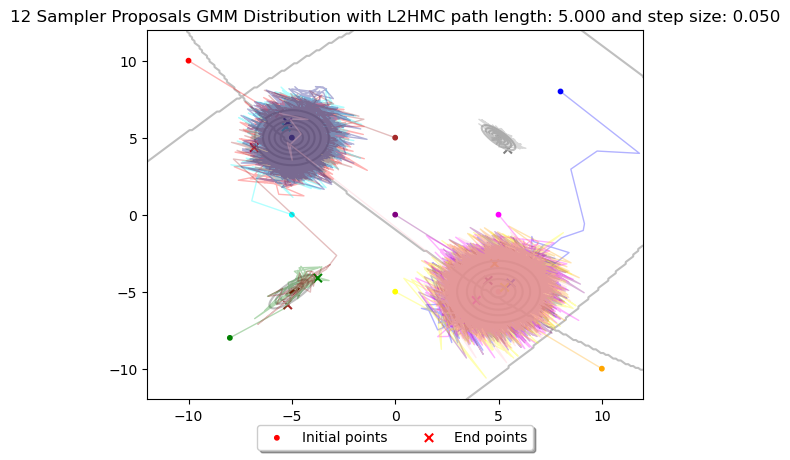

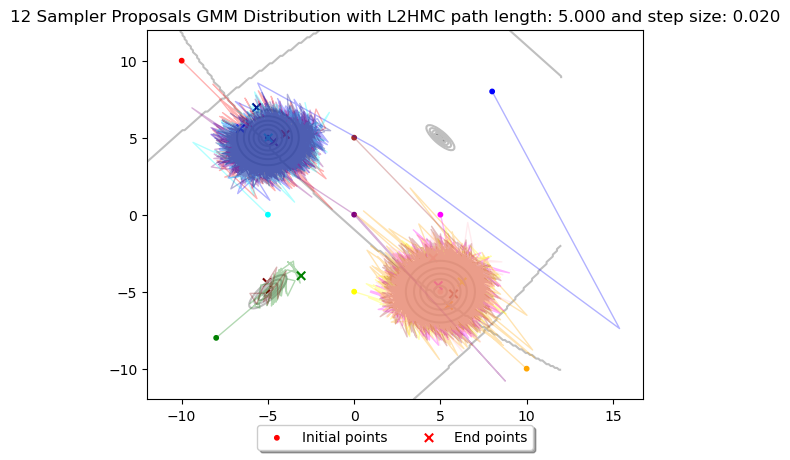

...

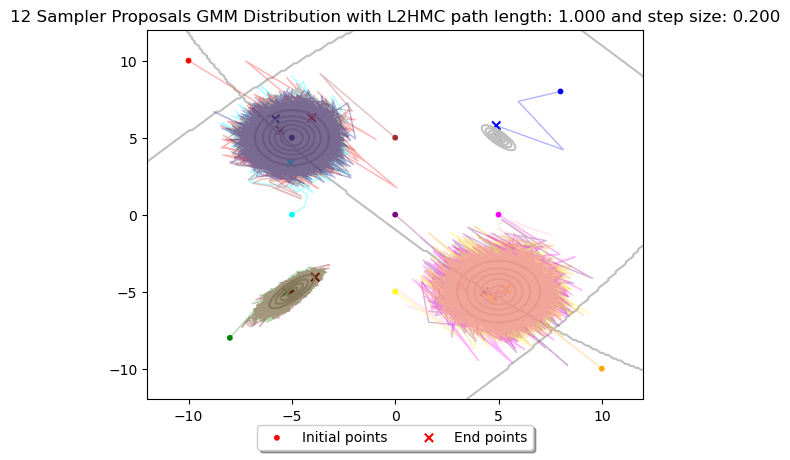

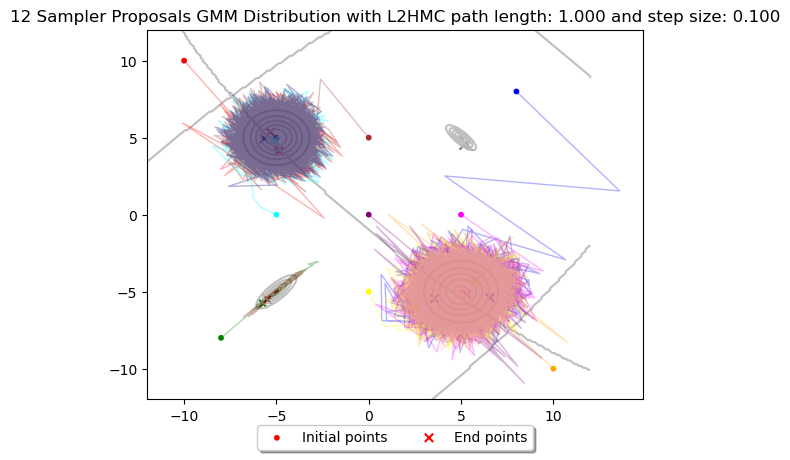

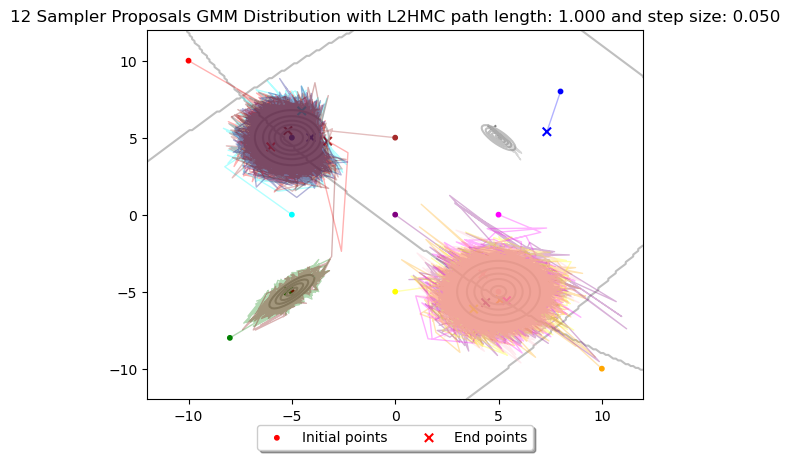

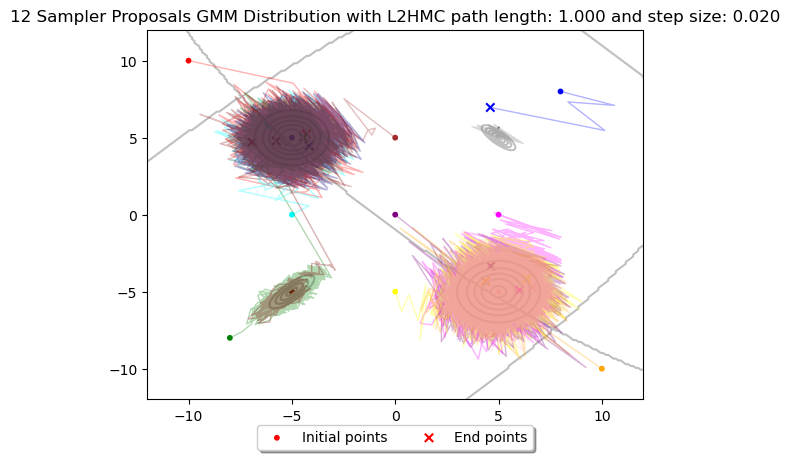

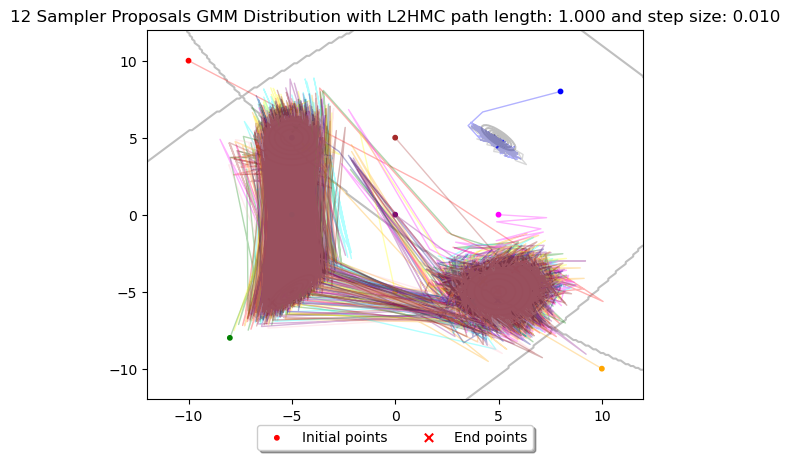

In [48]:
plot_compare2(title_gmm, "L2"+algo_hmc, mus, covs, colors, l2hmc, T, eps)
#moon_compare2(title_moon, "L2"+algo_hmc, colors, l2hmc, T, eps)

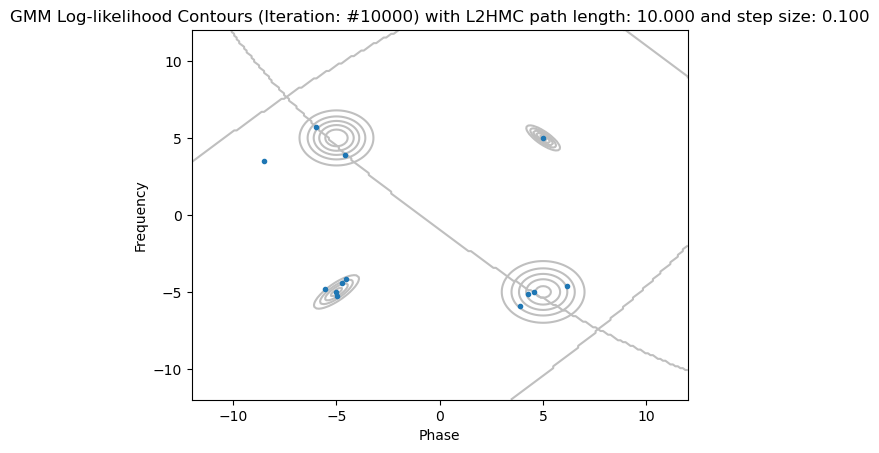

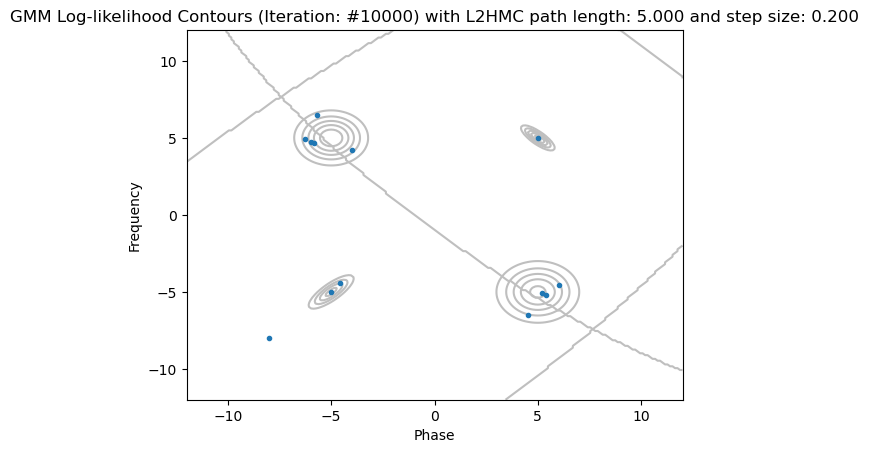

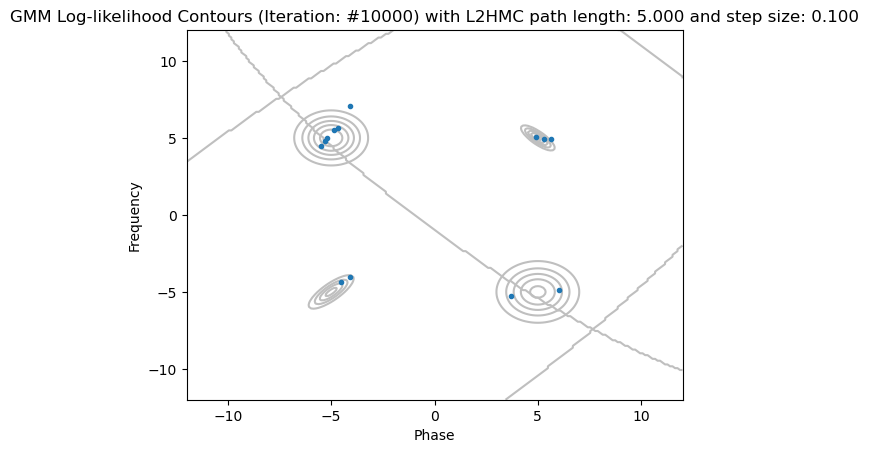

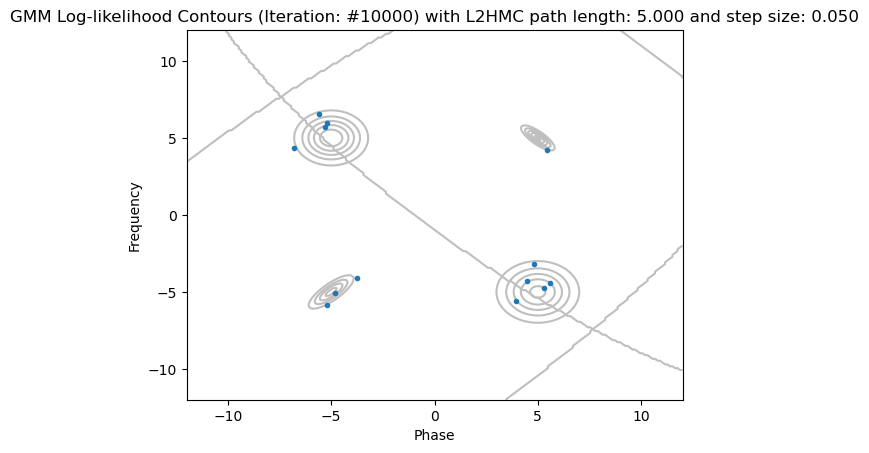

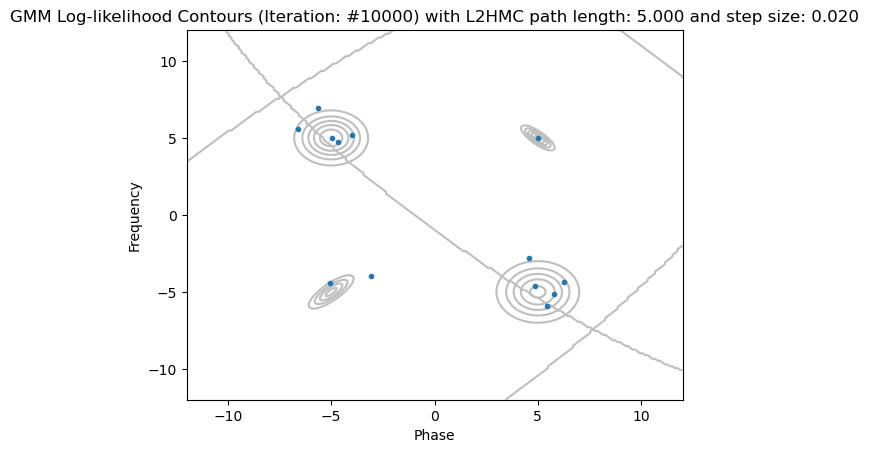

...

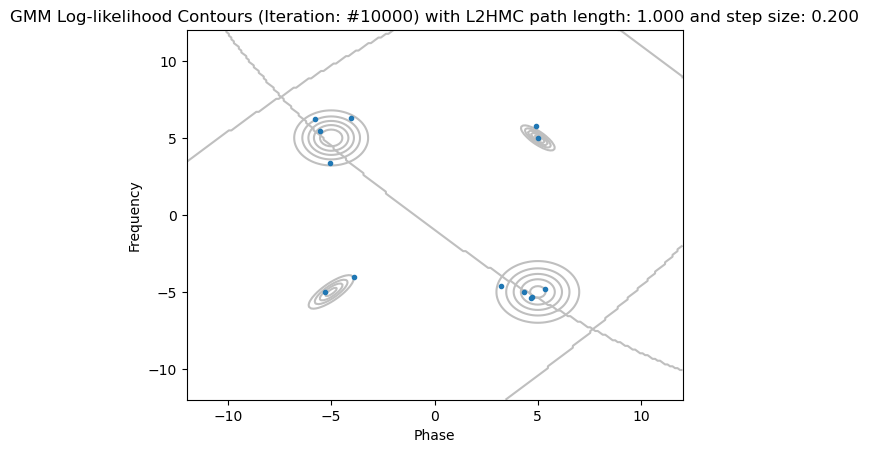

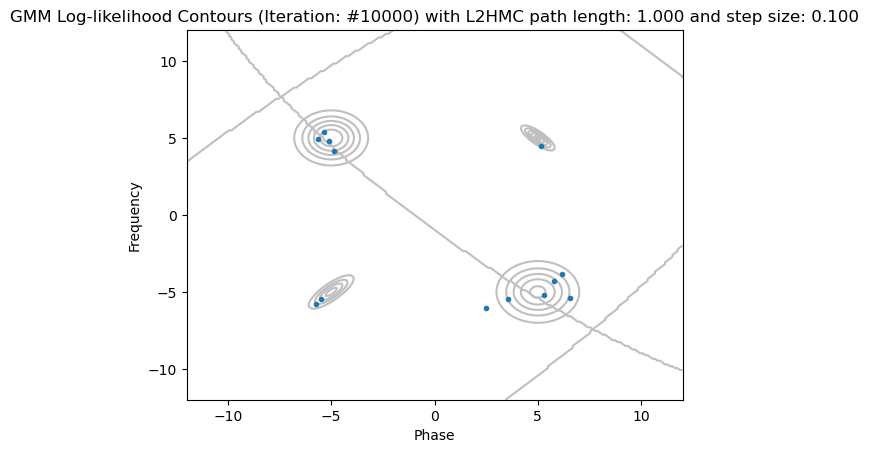

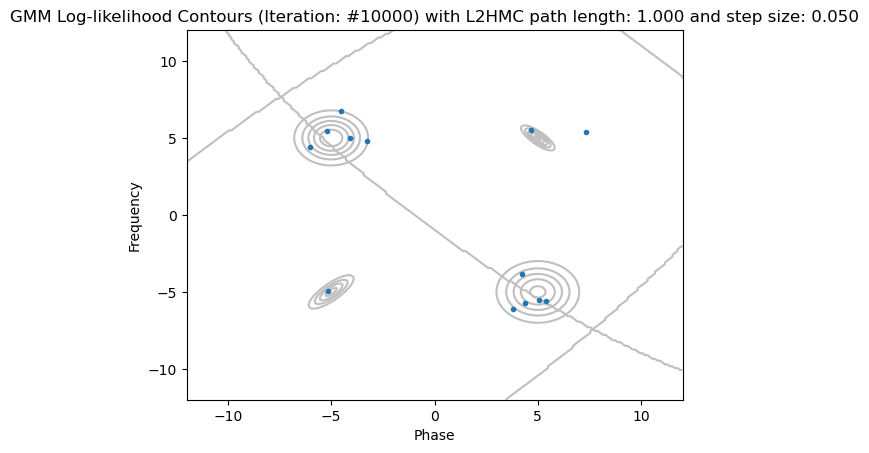

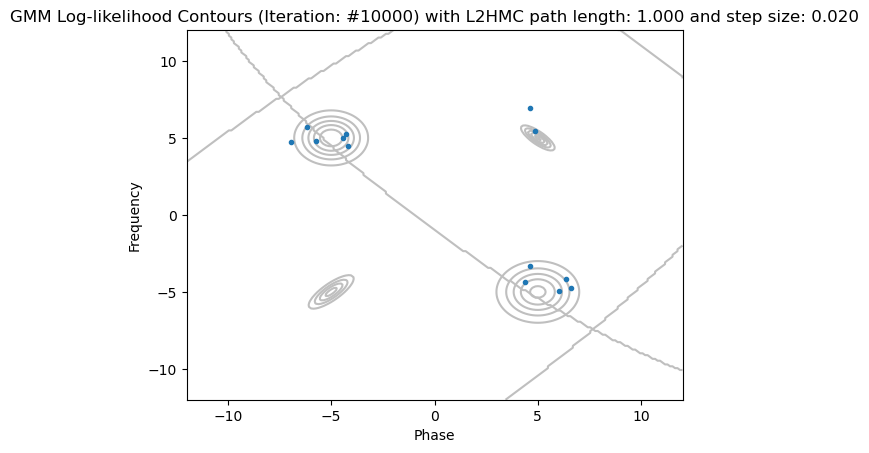

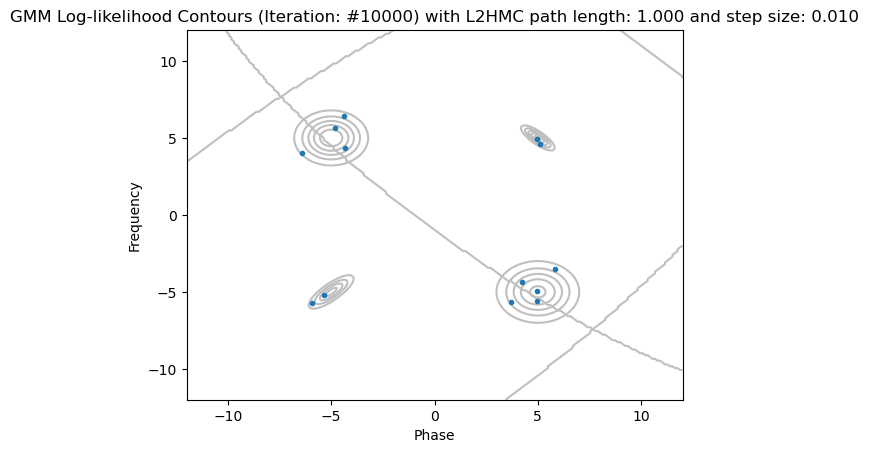

In [49]:
last_iteration2(title_gmm, 'L2'+algo_hmc, mus, covs, np.array(l2hmc).shape[1]-1, l2hmc, T, eps)
#moon_last_iteration2(title_moon, 'L2'+algo_hmc, np.array(l2hmc).shape[1]-1, l2hmc, T, eps)

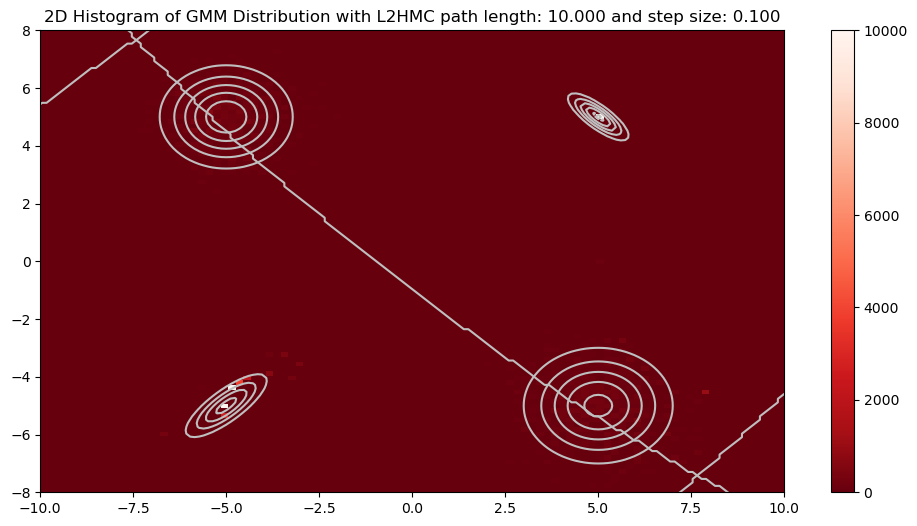

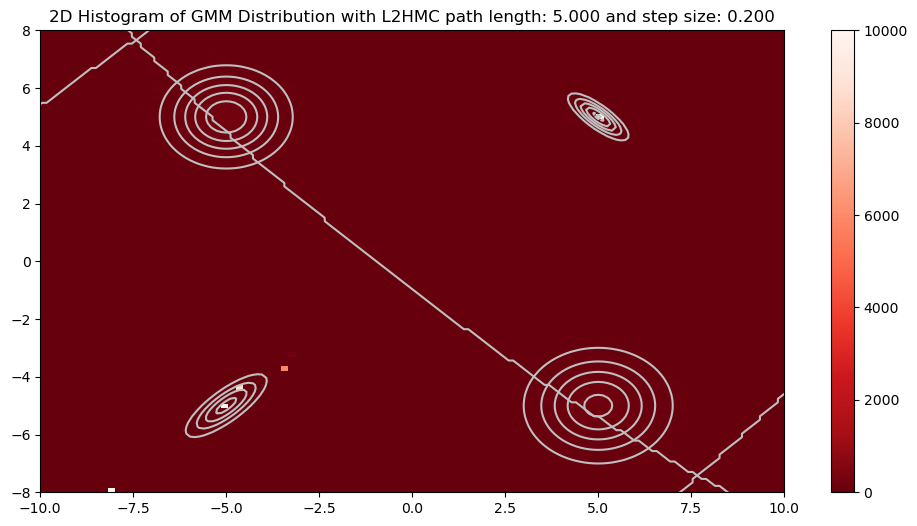

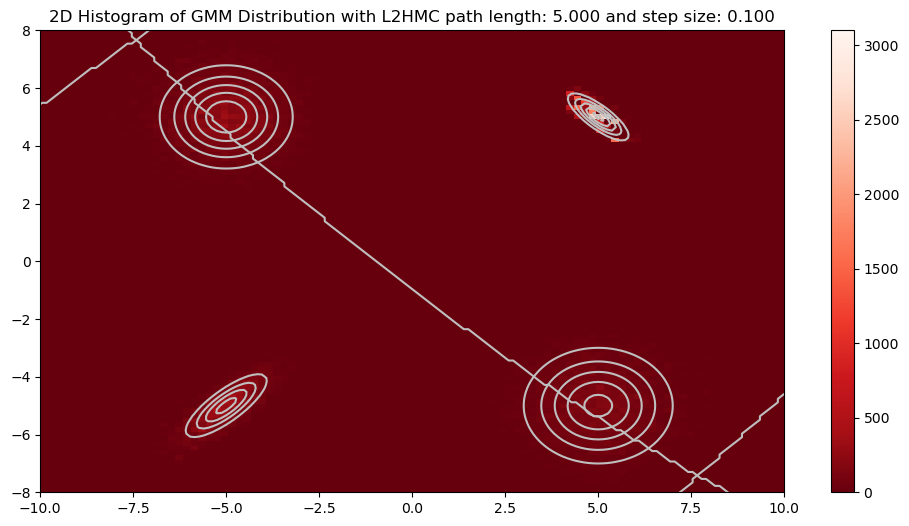

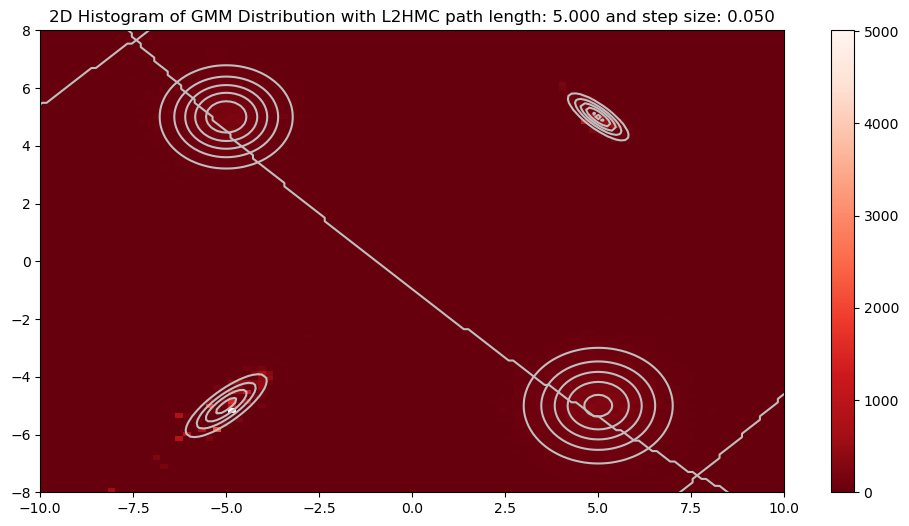

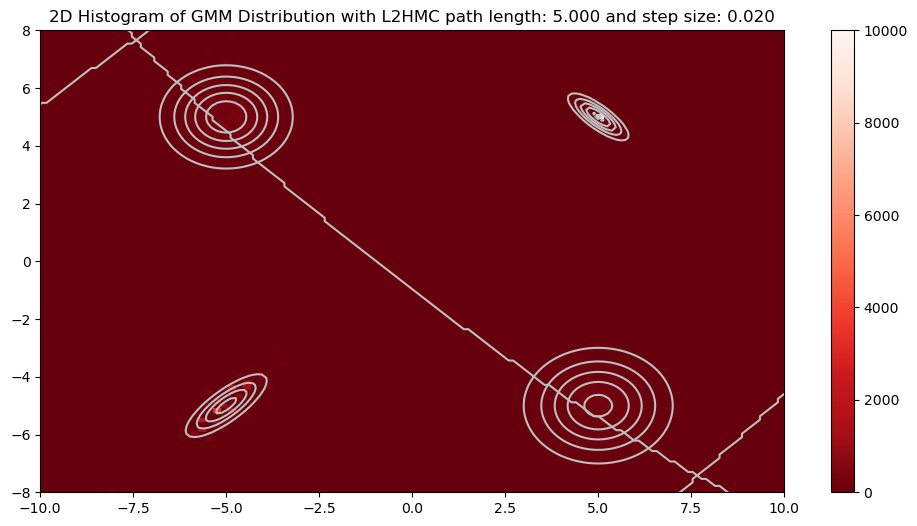

...

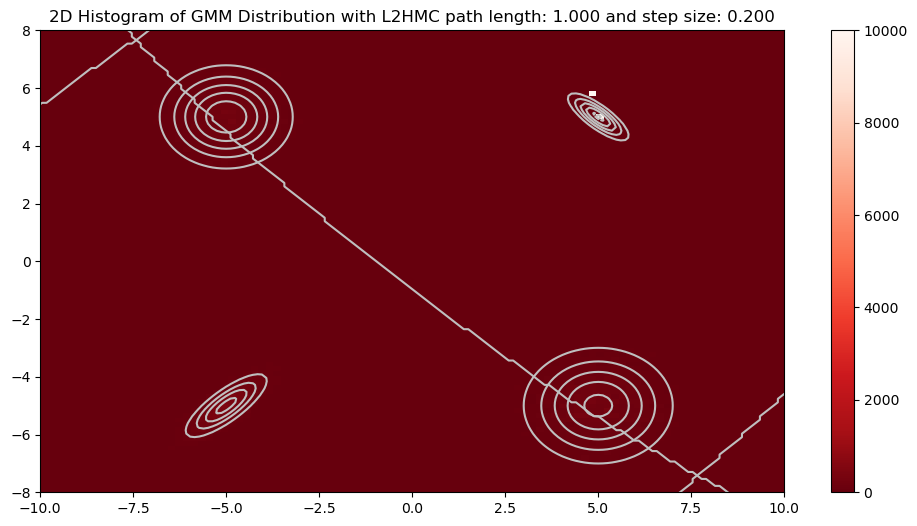

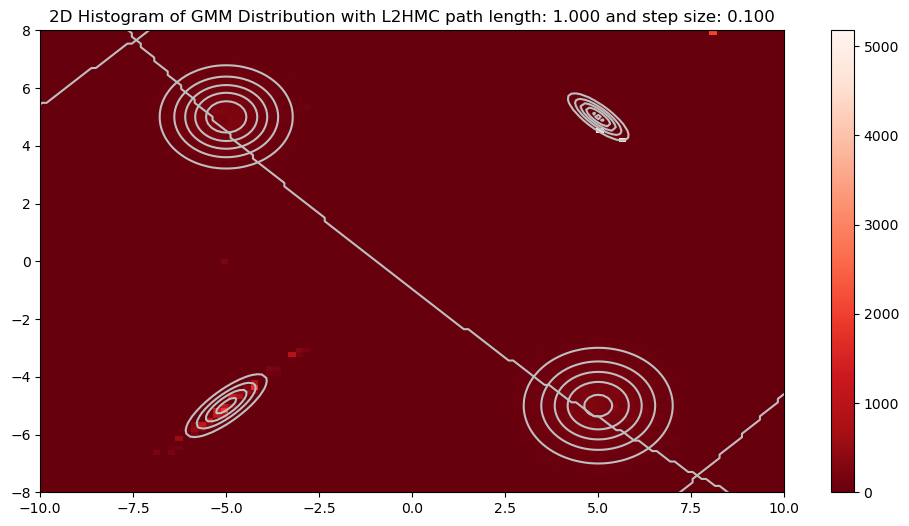

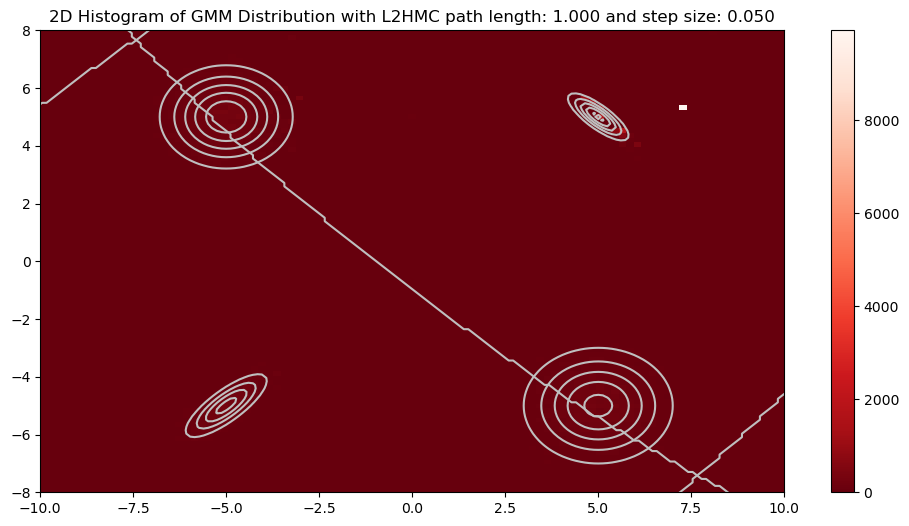

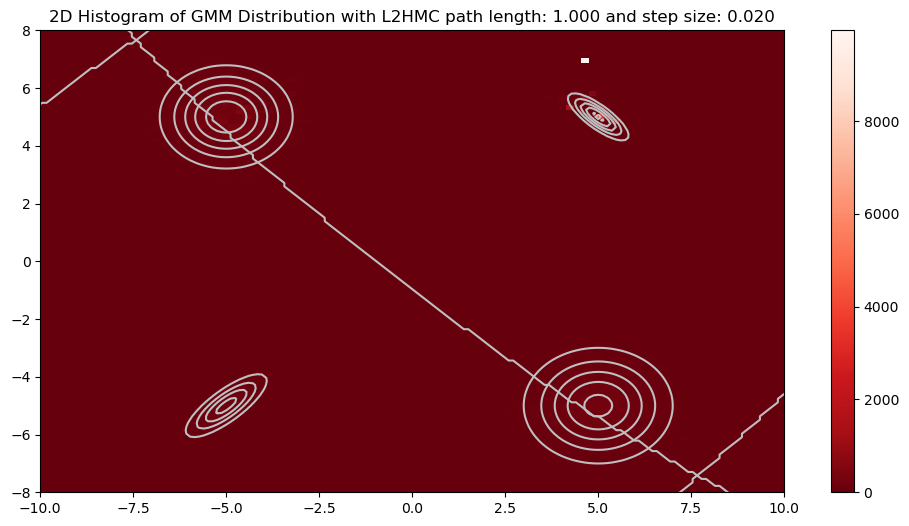

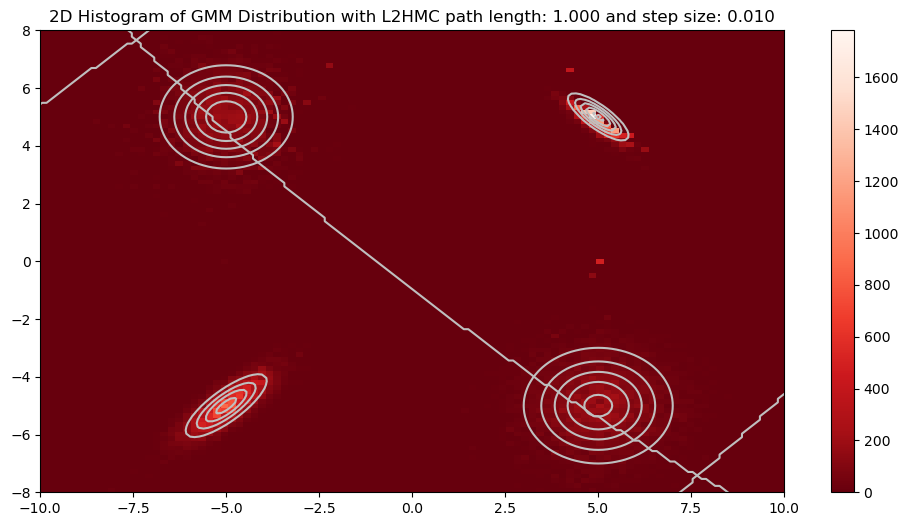

In [50]:
plot_density2(title_gmm, 'L2'+algo_hmc, mus, covs, l2hmc, T, eps)
#moon_density2(title_moon,'L2'+algo_hmc, l2hmc, T, eps)

# Autocorrelation Plot

In [ ]:
plots('ac', sample=rwm, c1=c).acplot(title_gmm)
plots('ac', sample=mala, c1=step).acplot(title_gmm)
plots('ac', sample=hmc, c1=T, c2=eps).acplot2(title_gmm)
plots('ac', sample=l2hmc, c1=T, c2=eps).acplot2(title_gmm)